# Clasificador de Galaxias con Anillos — Notebook Unificado (Stage 0 + Stage 1 + Stage 2)

---
# Parte 1: Instalación y configuración

> **Nota:** Ejecutar esta celda solo la primera vez o si falta algún paquete.
> Zoobot se instala desde PyPI. Se requiere PyTorch previamente instalado.


In [1]:
pip install scikit-image

Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
print(f"PyTorch: {torch.__version__}")
print(f"CUDA disponible: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"CUDA: {torch.version.cuda}")
else:
    print("⚠️ Sigue sin detectar GPU.")
    print("   Ejecuta en terminal: nvidia-smi")
    print("   Para ver qué versión de CUDA tienes y ajusta la línea de arriba.")

PyTorch: 2.5.1+cu121
CUDA disponible: True
GPU: NVIDIA GeForce RTX 4070 Laptop GPU
CUDA: 12.1


---
# Parte 2: Imports globales


In [3]:
# ============================================================
# Imports
# ============================================================
import os
import io
import re
import cv2
import time
import glob
import shutil
import random
import pathlib
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor, as_completed

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms

from astropy.io import fits
from astropy.visualization import (
    make_lupton_rgb, ZScaleInterval, MinMaxInterval, LogStretch
)

from scipy import ndimage
from scipy.signal import find_peaks, peak_prominences, savgol_filter
from skimage import filters, measure, morphology, segmentation
from skimage.draw import ellipse_perimeter
from skimage.filters import gaussian, threshold_otsu
from skimage.measure import label, regionprops
from skimage.morphology import (
    binary_closing, binary_dilation, binary_erosion, binary_opening, disk
)

from sklearn.metrics import (
    classification_report, confusion_matrix, f1_score,
    precision_recall_curve, roc_auc_score, roc_curve
)

import matplotlib.patches as mpatches
from matplotlib.patches import Ellipse

# Zoobot imports
from zoobot.pytorch.training import finetune
from zoobot.pytorch.estimators import define_model

import requests

warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.facecolor'] = 'white'

print("Imports completados exitosamente")


c:\Users\dark_\Downloads\Project\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Imports completados exitosamente


---
# Parte 3: Configuración global

> **⚠️ ADAPTAR:** Modifica las rutas a tus archivos y directorios según tu entorno.


# ============================================================
# Parte 3: Configuración global
# ============================================================

Este notebook unifica los tres stages previos con una sola fuente de verdad:

- **Backbone:** `Zoobot_Galaxy_Ring_Classifier_dataset2.ipynb`
- **Mapa de calor + augmentations:** `Zoobot_Galaxy_Ring_Classifier_corregido.ipynb`
- **Análisis de confianza y morfología guiada:** `Zoobot_Ring_Subclassifier_v7_Stage2.ipynb`

La ejecución queda centrada en el **dataset MaNGA parcheado con rutas de FITS**.


In [5]:
from pathlib import Path
import os

# ============================================================
# Configuración unificada
# ============================================================
PROJECT_ROOT = Path.cwd().parent

CSV_DATASET_FINAL = PROJECT_ROOT / "Data" / "dataset_manga_with_files_patched.csv"
OUTPUT_DIR = PROJECT_ROOT / "outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

TRANSFORM = "rgi_lognorm"

RING_CODES = {0: "none", 1: "inner", 2: "outer", 3: "inner+outer"}
RING_TYPE = list(RING_CODES.values())

BATCH_SIZE = 64
IMAGE_SIZE = 224
SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

PLATE_SCALE = 0.262

print("Project root:", PROJECT_ROOT)
print("CSV final:", CSV_DATASET_FINAL)
print("Output dir:", OUTPUT_DIR)
print("Transformación:", TRANSFORM)
print("Device:", DEVICE)


Project root: c:\Users\dark_\Downloads\Project_2 - Copy
CSV final: c:\Users\dark_\Downloads\Project_2 - Copy\Data\dataset_manga_with_files_patched.csv
Device: cuda


---
# Parte 4: Funciones auxiliares

## 4.1 Utilidades de conversión y URLs


## 4.2 Transformaciones de imagen FITS → RGB

Se implementan múltiples transformaciones para procesar las imágenes astronómicas de 3 bandas:
- **RGI Stack**: Composición RGB con `make_lupton_rgb`
- **RGI LogNorm**: Normalización logarítmica por canal
- **Unsharp Masking**: Resalte de bordes y detalles finos
- **PCA**: Reducción de dimensionalidad sobre los canales
- **Log-N Scale**: Transformación logarítmica clásica


In [6]:
class Transformations:
    @staticmethod
    def log_n_scale_transform(img_data, log_a=1000, clip_mode='minmax', med_val=20):
        """Aplica transformación Log-N a una imagen usando escala Zscale o Min/Max."""
        img = img_data.astype(np.float64)
        if clip_mode == 'zscale':
            interval = ZScaleInterval()
        elif clip_mode == 'minmax':
            interval = MinMaxInterval()
        p_low, p_high = interval.get_limits(img)
        if p_high <= p_low:
            return np.zeros_like(img, dtype=np.uint8)
        x = (img - p_low) / (p_high - p_low)
        x = np.clip(x, 0.0, 1.0)
        log_stretch = LogStretch(a=log_a)
        y = log_stretch(x)
        display_image = (y * 255.0).astype(np.uint8)
        if med_val:
            median_val = np.median(display_image)
            rendered_img = np.clip(display_image - median_val + med_val, 0, 255).astype(np.uint8)
        else:
            rendered_img = display_image
        return rendered_img

    @staticmethod
    def rgi_stack(channel_r, channel_g, channel_i):
        """Composición RGB directa con make_lupton_rgb."""
        return make_lupton_rgb(channel_r, channel_g, channel_i, stretch=0.5, Q=8)

    @staticmethod
    def rgi_lognorm_stack(channel_r, channel_g, channel_i, log_a=1000):
        """Composición RGB con normalización logarítmica por canal."""
        r = Transformations.log_n_scale_transform(channel_r, log_a=log_a)
        g = Transformations.log_n_scale_transform(channel_g, log_a=log_a)
        i = Transformations.log_n_scale_transform(channel_i, log_a=log_a)
        return np.stack([r, g, i], axis=-1)

    @staticmethod
    def unsharp_mask(channel_r, channel_g, channel_i, sigma=3, strength=1.5):
        """Resalte de detalles con unsharp masking."""
        def _unsharp(ch):
            ch_f = ch.astype(np.float64)
            blurred = gaussian(ch_f, sigma=sigma)
            sharp = ch_f + strength * (ch_f - blurred)
            return np.clip(sharp, 0, None)
        r = Transformations.log_n_scale_transform(_unsharp(channel_r))
        g = Transformations.log_n_scale_transform(_unsharp(channel_g))
        i = Transformations.log_n_scale_transform(_unsharp(channel_i))
        return np.stack([r, g, i], axis=-1)

    @staticmethod
    def pca_transform(channel_r, channel_g, channel_i):
        """Reducción PCA sobre los 3 canales."""
        h, w = channel_r.shape
        stack = np.stack([channel_r.ravel(), channel_g.ravel(), channel_i.ravel()], axis=0)
        mean = stack.mean(axis=1, keepdims=True)
        centered = stack - mean
        cov = np.cov(centered)
        eigvals, eigvecs = np.linalg.eigh(cov)
        idx = np.argsort(eigvals)[::-1]
        eigvecs = eigvecs[:, idx]
        pca = eigvecs.T @ centered
        result = np.zeros((h, w, 3), dtype=np.uint8)
        for c in range(3):
            ch = pca[c].reshape(h, w)
            ch = (ch - ch.min()) / (ch.max() - ch.min() + 1e-10) * 255
            result[:, :, c] = ch.astype(np.uint8)
        return result

    @staticmethod
    def apply_transform(r_band, g_band, i_band, transform_name):
        """Aplica la transformación seleccionada a las 3 bandas."""
        methods = {
            'rgi_stack':    lambda: Transformations.rgi_stack(r_band, g_band, i_band),
            'rgi_lognorm':  lambda: Transformations.rgi_lognorm_stack(r_band, g_band, i_band),
            'unsharp':      lambda: Transformations.unsharp_mask(r_band, g_band, i_band),
            'pca':          lambda: Transformations.pca_transform(r_band, g_band, i_band),
            'log_n_scale':  lambda: np.stack([
                Transformations.log_n_scale_transform(r_band),
                Transformations.log_n_scale_transform(g_band),
                Transformations.log_n_scale_transform(i_band),
            ], axis=-1),
        }
        func = methods.get(transform_name)
        if func is None:
            raise ValueError(f"Transformación desconocida: {transform_name}. "
                           f"Opciones: {list(methods.keys())}")
        try:
            result = func()
            if result is not None and result.dtype != np.uint8:
                result = np.clip(result, 0, 255).astype(np.uint8)
            return result
        except Exception as e:
            print(f"Error en transformación '{transform_name}': {e}")
            return None

print("Clase Transformations cargada")


Clase Transformations cargada


---
# Parte 5: Construcción del dataset

## 5.1 Carga y filtrado de catálogos

Se cargan los catálogos disponibles y se filtran las 4 clases de interés.


In [7]:
df_all = pd.read_csv(CSV_DATASET_FINAL)

print(f"Dataset total — Filas: {len(df_all)}, Columnas: {list(df_all.columns)}")

df_all = df_all[df_all["validation_status"] == "ok"].copy()
df_all = df_all[df_all["file_loc"].notna()].copy()

df_all["objID"] = df_all["id_str"].astype(str)
df_all["anillos_int"] = df_all["ring_class"].astype(int)
df_all["ring_type"] = df_all["anillos_int"].map(RING_CODES)
df_all["fits_path"] = df_all["file_loc"]

present_codes = sorted(df_all["anillos_int"].dropna().unique().tolist())
present_ring_types = [RING_CODES[c] for c in present_codes if c in RING_CODES]

if "none" not in present_ring_types:
    RING_TYPE = [rt for rt in ["inner", "outer", "inner+outer"] if rt in present_ring_types]
else:
    RING_TYPE = [rt for rt in ["none", "inner", "outer", "inner+outer"] if rt in present_ring_types]

df_all = df_all[df_all["ring_type"].isin(RING_TYPE)].copy().reset_index(drop=True)

print(f"\nTras filtrar registros válidos: {len(df_all)} galaxias")
print(df_all["ring_type"].value_counts())
print("\nDatasets de origen:")
print(df_all["dataset"].value_counts())
print("\nClases activas en esta corrida:", RING_TYPE)
print("Número de clases activas:", len(RING_TYPE))


Dataset total — Filas: 680, Columnas: ['id_str', 'ra', 'dec', 'z', 'anillos', 'dataset', 'ring_class', 'ring_class_0', 'ring_class_1', 'ring_class_2', 'ring_class_3', 'inner_ring', 'outer_ring', 'file_loc', 'file_rel', 'validation_status']

Tras filtrar registros válidos: 680 galaxias
ring_type
inner          459
outer          161
inner+outer     60
Name: count, dtype: int64

Datasets de origen:
dataset
manga    680
Name: count, dtype: int64


## 5.2 Descarga de FITS y transformación a PNG

Se descargan cutouts FITS del Legacy Survey DR9 y se aplica la transformación seleccionada.

> **Nota:** Esta celda puede tardar varias horas según el tamaño del catálogo y la velocidad de red. Las imágenes ya descargadas se saltan automáticamente.


---
# Parte 6: Análisis Exploratorio de Datos (EDA)

## 6.1 Distribución de clases


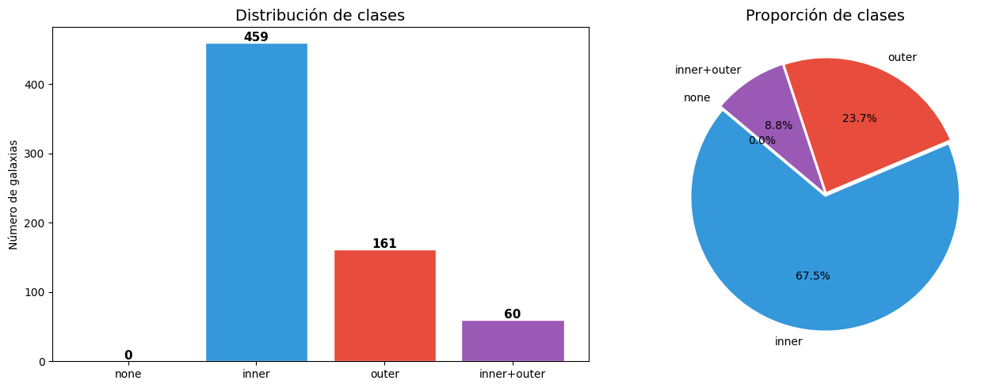


Resumen del desbalance:
  none           :     0 (0.0%)
  inner          :   459 (67.5%)
  outer          :   161 (23.7%)
  inner+outer    :    60 (8.8%)


In [8]:
# ============================================================
# Distribución de clases desde el dataset final
# ============================================================
class_counts = df_all["ring_type"].value_counts().reindex(RING_TYPE, fill_value=0).to_dict()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Barplot
colors = ['#2ecc71', '#3498db', '#e74c3c', '#9b59b6']
bars = axes[0].bar(class_counts.keys(), class_counts.values(), color=colors, edgecolor='white')
axes[0].set_title("Distribución de clases", fontsize=14)
axes[0].set_ylabel("Número de galaxias")

for bar, count in zip(bars, class_counts.values()):
    axes[0].text(
        bar.get_x() + bar.get_width() / 2.0,
        bar.get_height() + max(1, 0.005 * max(class_counts.values())),
        str(count),
        ha='center',
        fontsize=11,
        fontweight='bold'
    )

# Pie chart
axes[1].pie(
    class_counts.values(),
    labels=class_counts.keys(),
    autopct='%1.1f%%',
    colors=colors,
    startangle=140,
    explode=[0.02] * len(class_counts)
)
axes[1].set_title("Proporción de clases", fontsize=14)

plt.tight_layout()
plt.show()

print("\nResumen del desbalance:")
total = sum(class_counts.values())
for cls, n in class_counts.items():
    pct = (100 * n / total) if total > 0 else 0
    print(f"  {cls:15s}: {n:5d} ({pct:.1f}%)")

## 6.2 Visualización de muestras por clase


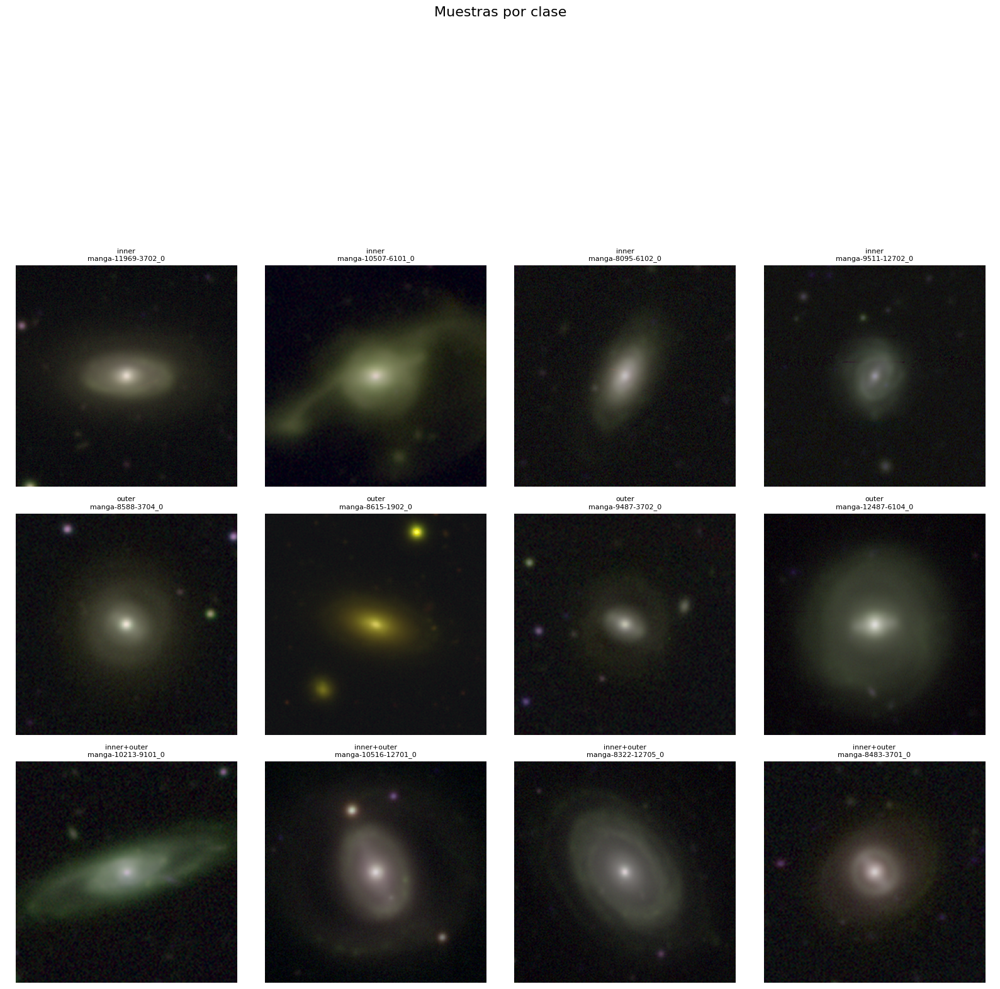

In [9]:
def plot_ring_class_samples(df, ring_types, samples_per_class=4):
    """Visualiza muestras aleatorias de cada clase usando FITS locales."""
    fig, axs = plt.subplots(
        len(ring_types),
        samples_per_class,
        figsize=(4 * samples_per_class, 4 * len(ring_types)),
        squeeze=False
    )

    for i, cls in enumerate(ring_types):
        cls_df = df[df["ring_type"] == cls].copy()

        if cls_df.empty:
            for j in range(samples_per_class):
                axs[i, j].axis("off")
            continue

        n_samples = min(samples_per_class, len(cls_df))
        sampled_rows = cls_df.sample(n=n_samples, random_state=SEED)

        for j in range(samples_per_class):
            ax = axs[i, j]

            if j >= n_samples:
                ax.axis("off")
                continue

            row = sampled_rows.iloc[j]
            fits_path = Path(row["fits_path"])

            try:
                with fits.open(fits_path) as hdul:
                    data = hdul[0].data

                    # Asume orden tipo Gabriel: [G, R, I]
                    g_band = data[0]
                    r_band = data[1]
                    i_band = data[2]

                    img = Transformations.apply_transform(
                        r_band, g_band, i_band, TRANSFORM
                    )

                ax.imshow(img)
                ax.set_title(
                    f"{cls}\n{Path(fits_path).stem[:30]}",
                    fontsize=8
                )
                ax.axis("off")

            except Exception as e:
                ax.text(
                    0.5, 0.5,
                    f"Error\n{fits_path.name}",
                    ha="center", va="center", fontsize=8
                )
                ax.set_title(f"{cls}", fontsize=8)
                ax.axis("off")

    plt.suptitle("Muestras por clase", fontsize=16)
    plt.tight_layout()
    plt.show()


plot_ring_class_samples(df_all, RING_TYPE)

## 6.3 Histogramas de intensidad por clase


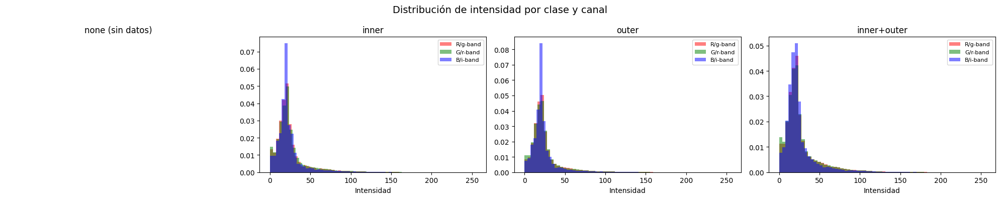

In [10]:
def plot_ring_intensity_histograms(df, ring_types, samples_per_class=50):
    """Genera histogramas de intensidad por canal para cada clase usando FITS locales."""
    fig, axs = plt.subplots(1, len(ring_types), figsize=(5 * len(ring_types), 4), squeeze=False)
    axs = axs[0]

    for idx, cls in enumerate(ring_types):
        cls_df = df[df["ring_type"] == cls].copy()
        ax = axs[idx]

        if cls_df.empty:
            ax.set_title(f"{cls} (sin datos)", fontsize=12)
            ax.axis("off")
            continue

        n_samples = min(samples_per_class, len(cls_df))
        sampled_rows = cls_df.sample(n=n_samples, random_state=SEED)

        all_r, all_g, all_b = [], [], []

        for _, row in sampled_rows.iterrows():
            fits_path = Path(row["fits_path"])

            try:
                with fits.open(fits_path) as hdul:
                    data = hdul[0].data

                    # Asume orden tipo Gabriel: [G, R, I]
                    g_band = data[0]
                    r_band = data[1]
                    i_band = data[2]

                    img = Transformations.apply_transform(r_band, g_band, i_band, TRANSFORM)

                    if img is None:
                        continue

                    img = np.asarray(img)
                    if img.ndim == 3 and img.shape[2] == 3:
                        all_r.extend(img[:, :, 0].ravel())
                        all_g.extend(img[:, :, 1].ravel())
                        all_b.extend(img[:, :, 2].ravel())

            except Exception:
                continue

        if len(all_r) == 0:
            ax.set_title(f"{cls} (sin imágenes válidas)", fontsize=12)
            ax.axis("off")
            continue

        ax.hist(all_r, bins=64, alpha=0.5, color='red', label='R/g-band', density=True)
        ax.hist(all_g, bins=64, alpha=0.5, color='green', label='G/r-band', density=True)
        ax.hist(all_b, bins=64, alpha=0.5, color='blue', label='B/i-band', density=True)
        ax.set_title(f"{cls}", fontsize=12)
        ax.set_xlabel("Intensidad")
        ax.legend(fontsize=8)

    plt.suptitle("Distribución de intensidad por clase y canal", fontsize=14)
    plt.tight_layout()
    plt.show()


plot_ring_intensity_histograms(df_all, RING_TYPE)

## 6.4 Estadísticas del dataset


In [11]:
def summarize_dataset_statistics(df, ring_types, max_samples_per_class=100):
    """Calcula estadísticas básicas del dataset usando FITS locales."""
    stats = {}

    for cls in ring_types:
        cls_df = df[df["ring_type"] == cls].copy()

        if cls_df.empty:
            stats[cls] = {"count": 0}
            continue

        n_samples = min(max_samples_per_class, len(cls_df))
        sampled_rows = cls_df.sample(n=n_samples, random_state=SEED)

        sizes = []
        mean_intensities = []

        for _, row in sampled_rows.iterrows():
            fits_path = Path(row["fits_path"])

            try:
                with fits.open(fits_path) as hdul:
                    data = hdul[0].data

                    # Asume orden tipo Gabriel: [G, R, I]
                    g_band = data[0]
                    r_band = data[1]
                    i_band = data[2]

                    img = Transformations.apply_transform(r_band, g_band, i_band, TRANSFORM)

                    if img is None:
                        continue

                    img = np.asarray(img)
                    sizes.append(img.shape[:2])
                    mean_intensities.append(float(img.mean()))

            except Exception:
                continue

        stats[cls] = {
            "count": len(cls_df),
            "mean_intensity": np.mean(mean_intensities) if mean_intensities else np.nan,
            "std_intensity": np.std(mean_intensities) if mean_intensities else np.nan,
            "sizes": set(sizes) if sizes else set(),
        }

    print(f"{'Clase':15s} | {'N':>6s} | {'Mean I':>8s} | {'Std I':>8s} | Tamaños")
    print("-" * 80)

    for cls, s in stats.items():
        if s["count"] == 0:
            print(f"{cls:15s} | {'0':>6s} | {'N/A':>8s} | {'N/A':>8s} |")
        else:
            mean_i = f"{s['mean_intensity']:.2f}" if not np.isnan(s["mean_intensity"]) else "N/A"
            std_i = f"{s['std_intensity']:.2f}" if not np.isnan(s["std_intensity"]) else "N/A"
            print(f"{cls:15s} | {s['count']:6d} | {mean_i:>8s} | {std_i:>8s} | {s['sizes']}")

    return stats


stats = summarize_dataset_statistics(df_all, RING_TYPE)

Clase           |      N |   Mean I |    Std I | Tamaños
--------------------------------------------------------------------------------
none            |      0 |      N/A |      N/A |
inner           |    459 |    24.89 |     2.64 | {(256, 256)}
outer           |    161 |    24.17 |     2.29 | {(256, 256)}
inner+outer     |     60 |    25.67 |     2.42 | {(256, 256)}


---
# Parte 7: Ingeniería de características

## 7.1 Comparación visual de transformaciones

Se aplican todas las transformaciones a una misma galaxia para comparar resultados.


In [12]:
def compare_transformations_all(data_dir, ring_types, n_samples=2):
    """Compara visualmente todas las transformaciones disponibles sobre FITS o PNG."""
    transform_names = ['rgi_stack', 'rgi_lognorm', 'unsharp', 'pca', 'log_n_scale']

    # Buscar un FITS de ejemplo o usar PNG existente
    for cls in ring_types:
        fits_files = list(Path(FITS_DIR).glob(f"**/*.fits"))
        png_files = list(Path(data_dir / cls).glob("*.png"))
        if png_files:
            break

    if not png_files:
        print("No se encontraron imágenes para comparar")
        return

    samples = np.random.choice(png_files, min(n_samples, len(png_files)), replace=False)

    for img_path in samples:
        img = np.array(Image.open(img_path).convert("RGB"))

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(img)
        axes[0].set_title(f"Transformación actual: {TRANSFORM}")
        axes[0].axis('off')

        # Mostrar histograma por canal
        for c, (color, label) in enumerate(zip(['red','green','blue'], ['R/g','G/r','B/i'])):
            axes[1].hist(img[:,:,c].ravel(), bins=64, alpha=0.4, color=color, label=label, density=True)
        axes[1].set_title("Histograma por canal")
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)

        plt.suptitle(Path(img_path).stem[:60], fontsize=10)
        plt.tight_layout()
        plt.show()

compare_transformations_all(DATA_DIR, RING_TYPE)


No se encontraron imágenes para comparar


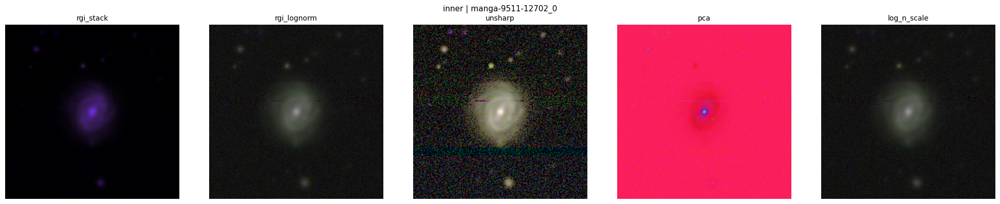

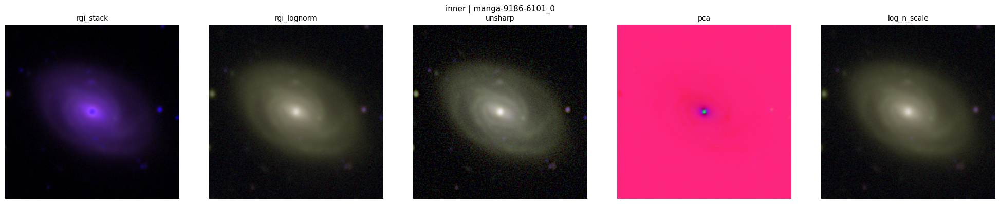

In [13]:
def compare_transformations_all(df, ring_types, n_samples=2):
    """Compara visualmente todas las transformaciones disponibles usando FITS locales."""
    transform_names = ['rgi_stack', 'rgi_lognorm', 'unsharp', 'pca', 'log_n_scale']

    valid_df = df[df["ring_type"].isin(ring_types)].copy()
    valid_df = valid_df[valid_df["fits_path"].notna()].copy()

    if valid_df.empty:
        print("No se encontraron FITS válidos para comparar")
        return

    n_samples = min(n_samples, len(valid_df))
    sampled_rows = valid_df.sample(n=n_samples, random_state=SEED)

    for _, row in sampled_rows.iterrows():
        fits_path = Path(row["fits_path"])

        try:
            with fits.open(fits_path) as hdul:
                data = hdul[0].data

                # Asume orden tipo Gabriel: [G, R, I]
                g_band = data[0]
                r_band = data[1]
                i_band = data[2]

            fig, axes = plt.subplots(1, len(transform_names), figsize=(4 * len(transform_names), 4))

            for ax, tname in zip(axes, transform_names):
                try:
                    img = Transformations.apply_transform(r_band, g_band, i_band, tname)
                    if img is None:
                        ax.text(0.5, 0.5, "Transformación\nfallida", ha="center", va="center")
                        ax.axis("off")
                        ax.set_title(tname)
                        continue

                    ax.imshow(img)
                    ax.set_title(tname, fontsize=10)
                    ax.axis("off")

                except Exception:
                    ax.text(0.5, 0.5, "Error", ha="center", va="center")
                    ax.axis("off")
                    ax.set_title(tname)

            plt.suptitle(
                f"{row['ring_type']} | {fits_path.stem[:60]}",
                fontsize=11
            )
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"No se pudo procesar {fits_path.name}: {e}")


compare_transformations_all(df_all, RING_TYPE)

---
# Parte 8: Preparación del dataset para entrenamiento

## 8.1 Split train/val y organización de carpetas


In [14]:
def initialize_dataset_layout(base_path):
    """Crea carpeta base para guardar splits en CSV."""
    base_path = Path(base_path)
    base_path.mkdir(parents=True, exist_ok=True)
    print(f"Directorio de splits creado en: {base_path}")


def build_train_val_split(df, base_path, train_ratio=0.8, seed=42):
    """Divide el dataset en train/val de forma estratificada por clase."""
    np.random.seed(seed)
    base_path = Path(base_path)

    train_parts = []
    val_parts = []

    sizes = {"previous": {}, "train": {}, "val": {}}

    for category in RING_TYPE:
        cls_df = df[df["ring_type"] == category].copy()
        cls_df = cls_df.sample(frac=1, random_state=seed).reset_index(drop=True)

        sizes["previous"][category] = len(cls_df)

        train_size = int(len(cls_df) * train_ratio)
        train_df = cls_df.iloc[:train_size].copy()
        val_df = cls_df.iloc[train_size:].copy()

        sizes["train"][category] = len(train_df)
        sizes["val"][category] = len(val_df)

        train_parts.append(train_df)
        val_parts.append(val_df)

    train_df = pd.concat(train_parts, ignore_index=True).sample(frac=1, random_state=seed).reset_index(drop=True)
    val_df = pd.concat(val_parts, ignore_index=True).sample(frac=1, random_state=seed).reset_index(drop=True)

    train_csv = base_path / "train_split.csv"
    val_csv = base_path / "val_split.csv"

    train_df.to_csv(train_csv, index=False)
    val_df.to_csv(val_csv, index=False)

    print("Dataset original:", sizes["previous"])
    print("Train:", sizes["train"])
    print("Val:", sizes["val"])
    print(f"\nTrain CSV: {train_csv}")
    print(f"Val CSV:   {val_csv}")

    return train_df, val_df


# Crear estructura y dividir
SPLIT_DIR = OUTPUT_DIR / DATASET_NAME
initialize_dataset_layout(SPLIT_DIR)
train_df, val_df = build_train_val_split(df_all, SPLIT_DIR, train_ratio=0.8, seed=SEED)

Directorio de splits creado en: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\dataset_zoobot_4cls
Dataset original: {'none': 0, 'inner': 459, 'outer': 161, 'inner+outer': 60}
Train: {'none': 0, 'inner': 367, 'outer': 128, 'inner+outer': 48}
Val: {'none': 0, 'inner': 92, 'outer': 33, 'inner+outer': 12}

Train CSV: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\dataset_zoobot_4cls\train_split.csv
Val CSV:   c:\Users\dark_\Downloads\Project_2 - Copy\outputs\dataset_zoobot_4cls\val_split.csv


## 8.2 Dataset personalizado con augmentation y balanceo


In [15]:
class GalaxyRingFitsDataset(Dataset):
    """Dataset de galaxias a partir de FITS locales usando un dataframe."""

    def __init__(self, df, categories, transform=None, target_count=None,
                 seed=42, balance=False):
        np.random.seed(seed)

        self.transform = transform
        self.class_to_idx = {cat: i for i, cat in enumerate(categories)}
        self.idx_to_class = {i: cat for cat, i in self.class_to_idx.items()}

        df = df.copy()
        df = df[df["ring_type"].isin(categories)].copy()
        df = df[df["fits_path"].notna()].copy()
        df = df[df["fits_path"].apply(lambda p: Path(p).exists())].copy()

        class_rows = {
            cat: df[df["ring_type"] == cat].copy().reset_index(drop=True)
            for cat in categories
        }

        if target_count is None:
            target_count = max(len(rows) for rows in class_rows.values()) if class_rows else 0

        samples = []

        if balance:
            for cat, rows in class_rows.items():
                if len(rows) == 0:
                    continue
                if len(rows) < target_count:
                    extra_idx = np.random.choice(rows.index, target_count - len(rows), replace=True)
                    rows_balanced = pd.concat([rows, rows.loc[extra_idx]], ignore_index=True)
                elif len(rows) > target_count:
                    keep_idx = np.random.choice(rows.index, target_count, replace=False)
                    rows_balanced = rows.loc[keep_idx].reset_index(drop=True)
                else:
                    rows_balanced = rows

                for _, row in rows_balanced.iterrows():
                    samples.append((row["fits_path"], self.class_to_idx[cat], row))
        else:
            for cat, rows in class_rows.items():
                for _, row in rows.iterrows():
                    samples.append((row["fits_path"], self.class_to_idx[cat], row))

        self.samples = samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        fits_path, label, row = self.samples[idx]
        fits_path = Path(fits_path)

        with fits.open(fits_path) as hdul:
            data = hdul[0].data

            # Asume orden tipo Gabriel: [G, R, I]
            g_band = data[0]
            r_band = data[1]
            i_band = data[2]

            img = Transformations.apply_transform(r_band, g_band, i_band, TRANSFORM)

            if img is None:
                raise ValueError(f"No se pudo transformar FITS: {fits_path}")

            img = Image.fromarray(img).convert("RGB")

        if self.transform:
            img = self.transform(img)

        return img, label

    def __repr__(self):
        counts = defaultdict(int)
        for _, lbl, _ in self.samples:
            counts[self.idx_to_class[lbl]] += 1
        return f"GalaxyRingFitsDataset({len(self)} samples: {dict(counts)})"


print("GalaxyRingFitsDataset definido")

GalaxyRingFitsDataset definido


## 8.3 Definir transformaciones y DataLoaders


In [16]:
# ============================================================
# Augmentaciones para entrenamiento (tomadas de Stage 1)
# ============================================================
train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(180, fill=0),
    transforms.RandomAffine(
        degrees=0,
        translate=(0.08, 0.08),
        scale=(0.85, 1.15),
        shear=8,
        fill=0
    ),
    transforms.RandomApply(
        [transforms.GaussianBlur(kernel_size=5, sigma=(0.1, 2.0))],
        p=0.3
    ),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.25, scale=(0.02, 0.15), ratio=(0.3, 3.3)),
])

val_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

train_dataset = GalaxyRingFitsDataset(
    train_df,
    categories=RING_TYPE,
    transform=train_transform,
    seed=SEED,
    balance=False
)

val_dataset = GalaxyRingFitsDataset(
    val_df,
    categories=RING_TYPE,
    transform=val_transform,
    seed=SEED,
    balance=False
)

train_labels = [lbl for _, lbl, _ in train_dataset.samples]
class_counts_train = defaultdict(int)
for lbl in train_labels:
    class_counts_train[lbl] += 1

weights_per_class = {cls: 1.0 / count for cls, count in class_counts_train.items()}
sample_weights = [weights_per_class[lbl] for lbl in train_labels]

sampler = WeightedRandomSampler(
    sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

train_dataloader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    sampler=sampler,
    num_workers=0
)

val_dataloader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

print("Dataset de entrenamiento:", train_dataset)
print("\nPesos del sampler por clase:")
for k, v in weights_per_class.items():
    print(f"  {train_dataset.idx_to_class[k]}: {v:.6f}")
print("\nDataset de validación:", val_dataset)


Dataset de entrenamiento: GalaxyRingFitsDataset(543 samples: {'inner': 367, 'outer': 128, 'inner+outer': 48})

Pesos del sampler por clase:
  inner: 0.002725
  outer: 0.007812
  inner+outer: 0.020833

Dataset de validación: GalaxyRingFitsDataset(137 samples: {'inner': 92, 'outer': 33, 'inner+outer': 12})


## 8.4 Visualización de imágenes aumentadas


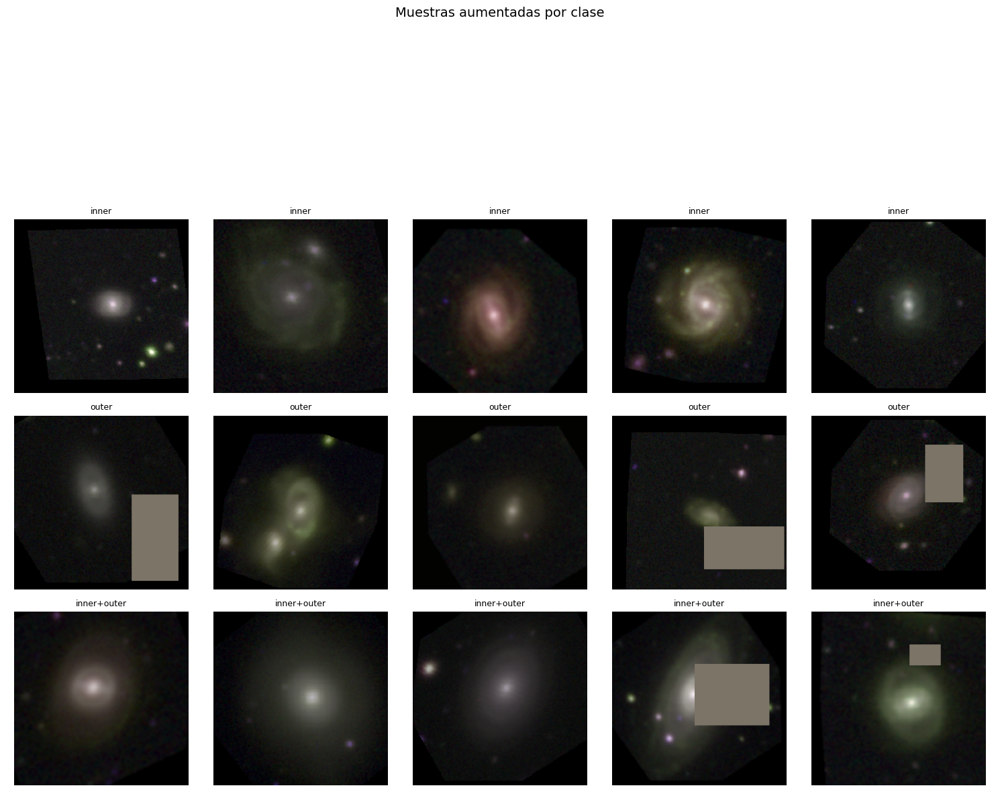

In [17]:
def visualize_augmented_images(dataset, ring_classes, n_images=5):
    """Visualiza imágenes aumentadas del dataset."""
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    fig, axs = plt.subplots(
        len(ring_classes),
        n_images,
        figsize=(3 * n_images, 3 * len(ring_classes)),
        squeeze=False
    )

    for i, cls in enumerate(ring_classes):
        indices = [
            idx for idx, (_, lbl, _) in enumerate(dataset.samples)
            if dataset.idx_to_class[lbl] == cls
        ]

        if not indices:
            for j in range(n_images):
                axs[i, j].axis("off")
            continue

        sample_idx = np.random.choice(
            indices,
            min(n_images, len(indices)),
            replace=False
        )

        for j in range(n_images):
            ax = axs[i, j]

            if j >= len(sample_idx):
                ax.axis("off")
                continue

            idx = sample_idx[j]
            img_tensor, label = dataset[idx]

            img_np = img_tensor.numpy().transpose(1, 2, 0)
            img_np = std * img_np + mean
            img_np = np.clip(img_np, 0, 1)

            ax.imshow(img_np)
            ax.set_title(f"{cls}", fontsize=9)
            ax.axis("off")

    plt.suptitle("Muestras aumentadas por clase", fontsize=14)
    plt.tight_layout()
    plt.show()


visualize_augmented_images(train_dataset, RING_TYPE)

---
# Parte 9: Fine-tuning de Zoobot

## 9.1 Fundamento teórico

**Zoobot** es un modelo preentrenado en millones de clasificaciones de Galaxy Zoo (Walters et al. 2023).
Sus representaciones capturan morfología galáctica de forma rica, lo que lo convierte en un excelente
backbone para transfer learning en tareas astronómicas específicas como la detección de anillos.

**Estrategia de entrenamiento progresivo:**
1. **Fase 1 — Solo head:** Se congela todo Zoobot y se entrena únicamente la capa de clasificación.
2. **Fase 2 — Head + capas superiores:** Se descongelan las últimas capas del encoder.
3. **Fase 3 — Fine-tuning completo:** Se descongelan más capas con learning rate muy bajo.

**Técnicas adicionales:**
- **Focal Loss** para manejar el desbalance de clases
- **Mixup** para regularización y mejor generalización
- **Cosine Annealing** para el learning rate schedule
- **Early stopping** basado en F1-score de clases con anillo


## 9.2 Modelo basado en Zoobot


In [18]:
# ============================================================
# Focal Loss para clases desbalanceadas
# ============================================================
class FocalLoss(nn.Module):
    """Focal Loss: FL(p_t) = -alpha_t * (1 - p_t)^gamma * log(p_t)"""

    def __init__(self, alpha=None, gamma=2.0, label_smoothing=0.05):
        super().__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.label_smoothing = label_smoothing

    def forward(self, inputs, targets):
        n_classes = inputs.size(1)
        smooth_targets = torch.zeros_like(inputs).scatter_(1, targets.unsqueeze(1), 1.0)
        smooth_targets = smooth_targets * (1 - self.label_smoothing) + self.label_smoothing / n_classes

        log_probs = F.log_softmax(inputs, dim=1)
        probs = torch.exp(log_probs)
        focal_weight = (1 - probs) ** self.gamma
        loss = -focal_weight * smooth_targets * log_probs

        if self.alpha is not None:
            alpha = self.alpha.to(inputs.device)
            loss = loss * alpha.unsqueeze(0)

        return loss.sum(dim=1).mean()


def mixup_data(x, y, alpha=0.3):
    """Mixup: mezcla lineal de pares de imágenes."""
    lam = np.random.beta(alpha, alpha) if alpha > 0 else 1.0
    index = torch.randperm(x.size(0)).to(x.device)
    mixed_x = lam * x + (1 - lam) * x[index]
    return mixed_x, y, y[index], lam


def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)


print("FocalLoss y Mixup definidos")


FocalLoss y Mixup definidos


In [19]:
# ============================================================
# Modelo Zoobot para clasificación de anillos
# Backbone Stage 0 + head y criterio ajustados con lógica de Stage 2
# ============================================================

import timm

class ZoobotRingClassifier(nn.Module):
    def __init__(self, n_classes=None, dropout=0.4,
                 encoder_name='hf_hub:mwalmsley/zoobot-encoder-convnext_nano'):
        super().__init__()
        self.device = DEVICE
        self.ring_type = RING_TYPE
        self.n_classes = n_classes or len(RING_TYPE)

        print(f"Cargando encoder: {encoder_name}")
        self.encoder = timm.create_model(
            encoder_name,
            pretrained=True,
            num_classes=0,
        )

        with torch.no_grad():
            dummy = torch.randn(1, 3, IMAGE_SIZE, IMAGE_SIZE)
            encoder_out = self.encoder(dummy)
            if isinstance(encoder_out, tuple):
                encoder_out = encoder_out[0]
            if encoder_out.dim() > 2:
                encoder_out = F.adaptive_avg_pool2d(encoder_out, 1).flatten(1)
            encoder_dim = encoder_out.shape[-1]

        print(f"Encoder cargado — dim salida: {encoder_dim}")
        print(f"Clases activas del experimento: {self.ring_type}")

        self.head = nn.Sequential(
            nn.BatchNorm1d(encoder_dim),
            nn.Dropout(p=dropout),
            nn.Linear(encoder_dim, 128),
            nn.GELU(),
            nn.BatchNorm1d(128),
            nn.Dropout(p=dropout * 0.5),
            nn.Linear(128, self.n_classes),
        )

        for m in self.head.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                nn.init.zeros_(m.bias)

        self.class_weights = torch.ones(self.n_classes)
        self.criterion = FocalLoss(
            alpha=self.class_weights,
            gamma=2.0,
            label_smoothing=0.05
        )
        self.mixup_alpha = 0.3

        self.to(self.device)

    def forward(self, x):
        features = self.encoder(x)
        if isinstance(features, tuple):
            features = features[0]
        if features.dim() > 2:
            features = F.adaptive_avg_pool2d(features, 1).flatten(1)
        return self.head(features)

    def save_model(self, path):
        torch.save(self.state_dict(), path)
        print(f"Modelo guardado: {path}")

    def load_model(self, path):
        self.load_state_dict(torch.load(path, map_location=self.device))
        print(f"Modelo cargado: {path}")

    def __str__(self):
        total = sum(p.numel() for p in self.parameters())
        trainable = sum(p.numel() for p in self.parameters() if p.requires_grad)
        return (
            f"ZoobotRingClassifier | Clases: {self.ring_type}\n"
            f"  Parámetros: {total:,} total, {trainable:,} entrenables\n"
            f"  Device: {self.device}\n"
            f"  Loss: FocalLoss(gamma=2) | Mixup(alpha={self.mixup_alpha})"
        )

    def set_phase(self, phase):
        for param in self.parameters():
            param.requires_grad = False

        if phase >= 1:
            for param in self.head.parameters():
                param.requires_grad = True
            print("  Descongelado: Head")

        if phase >= 2:
            encoder_children = list(self.encoder.children())
            for child in encoder_children[-2:]:
                for param in child.parameters():
                    param.requires_grad = True
            print("  Descongelado: últimas capas del encoder")

        if phase >= 3:
            for param in self.encoder.parameters():
                param.requires_grad = True
            print("  Descongelado: encoder completo")

        trainable = sum(p.numel() for p in self.parameters() if p.requires_grad)
        total = sum(p.numel() for p in self.parameters())
        print(f"  Parámetros entrenables: {trainable:,}/{total:,} ({100*trainable/total:.1f}%)")

    def _compute_class_weights(self, loader):
        counts = defaultdict(int)
        for _, labels in loader:
            for l in labels.numpy():
                counts[l] += 1

        total = sum(counts.values())
        n_seen = len(counts)
        weights = torch.zeros(self.n_classes)

        for idx, count in counts.items():
            weights[idx] = total / (n_seen * count)

        return weights / weights.mean()

    def _validate(self, val_loader):
        self.eval()
        all_preds, all_labels = [], []
        running_loss, total = 0.0, 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(self.device), labels.to(self.device)
                outputs = self(images)
                loss = self.criterion(outputs, labels)

                running_loss += loss.item() * images.size(0)
                total += images.size(0)

                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        val_loss = running_loss / total
        val_acc = (np.array(all_preds) == np.array(all_labels)).mean()
        macro_f1 = f1_score(all_labels, all_preds, average='macro')
        return val_loss, val_acc, macro_f1

    def train_model(self, train_loader, val_loader, epochs=10, phase=1,
                    use_mixup=False, patience=8, lr=1e-3):
        self.set_phase(phase)

        class_weights = self._compute_class_weights(train_loader)
        self.class_weights = class_weights
        self.criterion = FocalLoss(
            alpha=class_weights,
            gamma=2.0,
            label_smoothing=0.05
        )

        optimizer = torch.optim.AdamW(
            filter(lambda p: p.requires_grad, self.parameters()),
            lr=lr, weight_decay=1e-4
        )
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

        history = {
            "train_loss": [], "val_loss": [],
            "train_acc": [], "val_acc": [],
            "macro_f1": []
        }

        best_f1 = -np.inf
        best_path = OUTPUT_DIR / f"best_zoobot_phase{phase}.pt"
        patience_counter = 0

        for epoch in range(1, epochs + 1):
            self.train()
            running_loss, correct, total = 0.0, 0, 0

            for images, labels in train_loader:
                images, labels = images.to(self.device), labels.to(self.device)
                optimizer.zero_grad()

                if use_mixup:
                    images_mix, y_a, y_b, lam = mixup_data(images, labels, alpha=self.mixup_alpha)
                    outputs = self(images_mix)
                    loss = mixup_criterion(self.criterion, outputs, y_a, y_b, lam)
                else:
                    outputs = self(images)
                    loss = self.criterion(outputs, labels)

                loss.backward()
                torch.nn.utils.clip_grad_norm_(self.parameters(), max_norm=1.0)
                optimizer.step()

                running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                correct += (preds == labels).sum().item()
                total += images.size(0)

            train_loss = running_loss / total
            train_acc = correct / total
            val_loss, val_acc, macro_f1 = self._validate(val_loader)

            history["train_loss"].append(train_loss)
            history["val_loss"].append(val_loss)
            history["train_acc"].append(train_acc)
            history["val_acc"].append(val_acc)
            history["macro_f1"].append(macro_f1)

            print(
                f"Epoch {epoch:02d}/{epochs} | "
                f"train_loss={train_loss:.4f} | val_loss={val_loss:.4f} | "
                f"train_acc={train_acc:.4f} | val_acc={val_acc:.4f} | "
                f"macro_f1={macro_f1:.4f}"
            )

            if macro_f1 > best_f1:
                best_f1 = macro_f1
                self.save_model(str(best_path))
                patience_counter = 0
            else:
                patience_counter += 1

            scheduler.step()

            if patience_counter >= patience:
                print(f"Early stopping en epoch {epoch} (patience={patience})")
                break

        return history

    def evaluate(self, loader, plot=True):
        self.eval()
        all_preds, all_labels = [], []

        with torch.no_grad():
            for images, labels in loader:
                images = images.to(self.device)
                outputs = self(images)
                _, preds = torch.max(outputs, 1)

                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.numpy())

        print("\nClassification Report:")
        print(classification_report(all_labels, all_preds, target_names=self.ring_type))

        if plot:
            fig, axes = plt.subplots(1, 2, figsize=(16, 6))

            conf_matrix = confusion_matrix(
                all_labels,
                all_preds,
                labels=list(range(self.n_classes))
            )
            sns.heatmap(
                conf_matrix,
                annot=True,
                fmt="d",
                xticklabels=self.ring_type,
                yticklabels=self.ring_type,
                cmap="Blues",
                ax=axes[0],
                cbar=False
            )
            axes[0].set_xlabel("Predicho")
            axes[0].set_ylabel("Real")
            axes[0].set_title("Matriz de Confusión")

            row_sums = conf_matrix.sum(axis=1, keepdims=True)
            conf_norm = np.divide(
                conf_matrix.astype(float),
                row_sums,
                out=np.zeros_like(conf_matrix, dtype=float),
                where=row_sums != 0
            )
            sns.heatmap(
                conf_norm,
                annot=True,
                fmt=".2f",
                xticklabels=self.ring_type,
                yticklabels=self.ring_type,
                cmap="Greens",
                ax=axes[1],
                cbar=False
            )
            axes[1].set_xlabel("Predicho")
            axes[1].set_ylabel("Real")
            axes[1].set_title("Matriz de Confusión Normalizada")

            plt.tight_layout()
            plt.show()

        return classification_report(all_labels, all_preds, target_names=self.ring_type, output_dict=True)


model = ZoobotRingClassifier(n_classes=len(RING_TYPE), dropout=0.4)
print(model)


Cargando encoder: hf_hub:mwalmsley/zoobot-encoder-convnext_nano
Encoder cargado — dim salida: 640
ZoobotRingClassifier | Clases: ['none', 'inner', 'outer', 'inner+outer']
  Parámetros: 15,119,476 total, 15,119,476 entrenables
  Device: cuda
  Loss: FocalLoss(gamma=2) | Mixup(alpha=0.3)


## 9.3 Entrenamiento progresivo (3 fases)


In [20]:
# ============================================================
# Fase 1: Solo Head (10 épocas, LR alto)
# ============================================================
history_f1 = model.train_model(
    train_dataloader, val_dataloader,
    epochs=10, phase=1, use_mixup=False, patience=8, lr=1e-3
)



 Fase 1 — 10 épocas | Mixup=False | LR=0.001
  Descongelado: Head
  Parámetros entrenables: 166,916 / 15,119,476 (1.1%)
  Pesos de clase: {'none': '0.000', 'inner': '1.201', 'outer': '0.818', 'inner+outer': '0.981'}
  E01/10 | L 0.8042 A 0.429 | VL 0.8022 VA 0.445 | RF1 0.3792 | lr 9.05e-04
Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase1_f138.pt
  E02/10 | L 0.6301 A 0.534 | VL 0.8172 VA 0.482 | RF1 0.3963 | lr 6.55e-04
Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase1_f140.pt
  E03/10 | L 0.6065 A 0.573 | VL 0.7633 VA 0.547 | RF1 0.4779 | lr 3.46e-04
Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase1_f148.pt
  E04/10 | L 0.5570 A 0.606 | VL 0.6725 VA 0.599 | RF1 0.5197 | lr 9.64e-05
Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase1_f152.pt
  E05/10 | L 0.5209 A 0.591 | VL 0.6421 VA 0.606 | RF1 0.5200 | lr 1.00e-03
Modelo guardado: c:\Users\d

In [21]:
# ============================================================
# Fase 2: Head + últimas capas del encoder (15 épocas)
# ============================================================
history_f2 = model.train_model(
    train_dataloader, val_dataloader,
    epochs=15, phase=2, use_mixup=True, patience=8, lr=2e-4
)



 Fase 2 — 15 épocas | Mixup=True | LR=0.0002
  Descongelado: Head
  Descongelado: Head + últimas capas encoder
  Parámetros entrenables: 168,196 / 15,119,476 (1.1%)
  Pesos de clase: {'none': '0.000', 'inner': '0.931', 'outer': '1.038', 'inner+outer': '1.032'}
  E01/15 | L 0.5652 A 0.569 | VL 0.5184 VA 0.628 | RF1 0.5313 | lr 1.81e-04
Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase2_f153.pt
  E02/15 | L 0.4623 A 0.591 | VL 0.5064 VA 0.606 | RF1 0.4977 | lr 1.31e-04
  E03/15 | L 0.5116 A 0.499 | VL 0.4966 VA 0.599 | RF1 0.5020 | lr 6.98e-05
  E04/15 | L 0.4896 A 0.525 | VL 0.4945 VA 0.613 | RF1 0.5206 | lr 2.00e-05
  E05/15 | L 0.5380 A 0.554 | VL 0.5175 VA 0.577 | RF1 0.4833 | lr 2.00e-04
  E06/15 | L 0.5584 A 0.562 | VL 0.4989 VA 0.591 | RF1 0.4971 | lr 1.81e-04
  E07/15 | L 0.4728 A 0.610 | VL 0.4868 VA 0.584 | RF1 0.4872 | lr 1.31e-04
  E08/15 | L 0.4334 A 0.611 | VL 0.4868 VA 0.599 | RF1 0.5045 | lr 6.98e-05
  E09/15 | L 0.4294 A 0.654 | VL 0.4

In [22]:
# ============================================================
# Fase 3: Fine-tuning completo (20 épocas, LR bajo)
# ============================================================
history_f3 = model.train_model(
    train_dataloader, val_dataloader,
    epochs=20, phase=3, use_mixup=True, patience=10, lr=5e-5
)



 Fase 3 — 20 épocas | Mixup=True | LR=5e-05
  Descongelado: Head
  Descongelado: Head + últimas capas encoder
  Descongelado: Encoder completo + Head
  Parámetros entrenables: 15,119,476 / 15,119,476 (100.0%)
  Pesos de clase: {'none': '0.000', 'inner': '0.910', 'outer': '1.048', 'inner+outer': '1.042'}
  E01/20 | L 0.4692 A 0.608 | VL 0.4997 VA 0.613 | RF1 0.5073 | lr 4.53e-05
Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase3_f151.pt
  E02/20 | L 0.5082 A 0.479 | VL 0.5851 VA 0.599 | RF1 0.5223 | lr 3.31e-05
Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase3_f152.pt
  E03/20 | L 0.5373 A 0.497 | VL 0.5103 VA 0.628 | RF1 0.5331 | lr 1.79e-05
Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase3_f153.pt
  E04/20 | L 0.3797 A 0.587 | VL 0.4268 VA 0.620 | RF1 0.5058 | lr 5.68e-06
  E05/20 | L 0.4512 A 0.646 | VL 0.4321 VA 0.620 | RF1 0.5042 | lr 5.00e-05
  E06/20 | L 0.3891 A 0.575 | VL

## 9.4 Visualización de métricas de entrenamiento


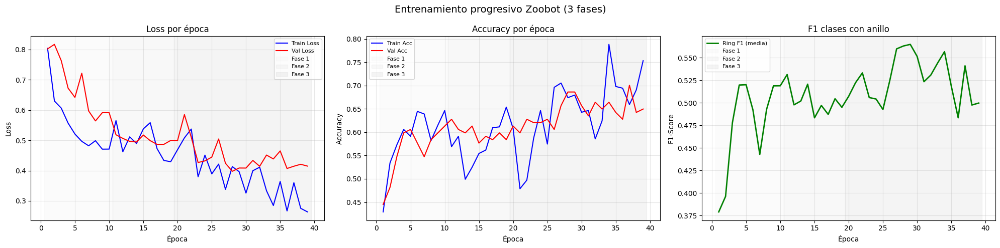

In [23]:
def plot_training_history(*histories, labels=None):
    """Grafica las métricas de entrenamiento de múltiples fases."""
    all_train_loss, all_val_loss = [], []
    all_train_acc, all_val_acc = [], []
    all_ring_f1 = []

    for h in histories:
        all_train_loss.extend(h["train_loss"])
        all_val_loss.extend(h["val_loss"])
        all_train_acc.extend(h["train_acc"])
        all_val_acc.extend(h["val_acc"])
        all_ring_f1.extend(h.get("ring_f1", []))

    epochs = range(1, len(all_train_loss) + 1)
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    colors_phase = ['#e8e8e8', '#d0d0d0', '#b8b8b8']

    # ── Loss ──
    axes[0].plot(epochs, all_train_loss, label='Train Loss', color='blue')
    axes[0].plot(epochs, all_val_loss, label='Val Loss', color='red')
    offset = 0
    for i, h in enumerate(histories):
        axes[0].axvspan(offset + 0.5, offset + len(h["train_loss"]) + 0.5,
                       alpha=0.15, color=colors_phase[i % 3], label=f"Fase {i+1}")
        offset += len(h["train_loss"])
    axes[0].set_xlabel('Época'); axes[0].set_ylabel('Loss')
    axes[0].set_title('Loss por época'); axes[0].legend(fontsize=8); axes[0].grid(True, alpha=0.3)

    # ── Accuracy ──
    axes[1].plot(epochs, all_train_acc, label='Train Acc', color='blue')
    axes[1].plot(epochs, all_val_acc, label='Val Acc', color='red')
    offset = 0
    for i, h in enumerate(histories):
        axes[1].axvspan(offset + 0.5, offset + len(h["train_acc"]) + 0.5,
                       alpha=0.15, color=colors_phase[i % 3], label=f"Fase {i+1}")
        offset += len(h["train_acc"])
    axes[1].set_xlabel('Época'); axes[1].set_ylabel('Accuracy')
    axes[1].set_title('Accuracy por época'); axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.3)

    # ── Ring F1 ──
    if all_ring_f1:
        axes[2].plot(epochs[:len(all_ring_f1)], all_ring_f1, label='Ring F1 (media)', color='green', linewidth=2)
        offset = 0
        for i, h in enumerate(histories):
            n = len(h.get("ring_f1", []))
            axes[2].axvspan(offset + 0.5, offset + n + 0.5,
                           alpha=0.15, color=colors_phase[i % 3], label=f"Fase {i+1}")
            offset += n
        axes[2].set_xlabel('Época'); axes[2].set_ylabel('F1-Score')
        axes[2].set_title('F1 clases con anillo'); axes[2].legend(fontsize=8); axes[2].grid(True, alpha=0.3)

    plt.suptitle("Entrenamiento progresivo Zoobot (3 fases)", fontsize=14)
    plt.tight_layout()
    plt.show()

plot_training_history(history_f1, history_f2, history_f3)


## 9.5 Evaluación final del modelo


Cargando mejor modelo: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase3_f156.pt
Modelo cargado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\best_zoobot_phase3_f156.pt

 CLASSIFICATION REPORT
              precision    recall  f1-score   support

        none       0.00      0.00      0.00         0
       inner       0.91      0.70      0.79        92
       outer       0.59      0.79      0.68        33
 inner+outer       0.17      0.33      0.23        12

    accuracy                           0.69       137
   macro avg       0.42      0.45      0.42       137
weighted avg       0.77      0.69      0.71       137



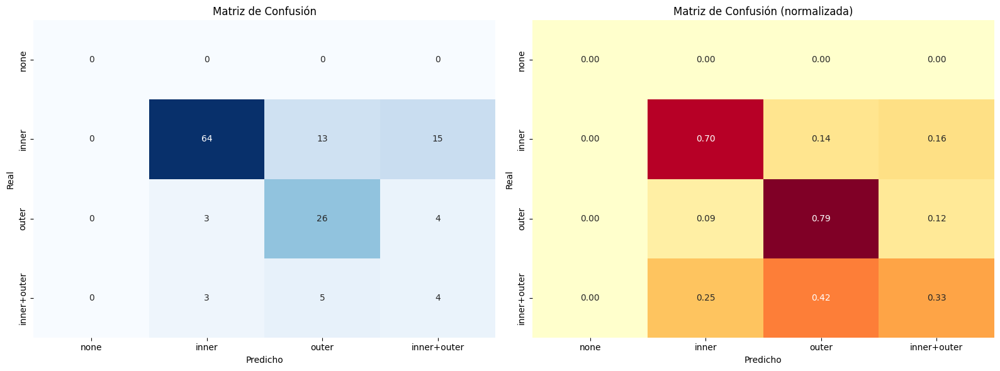

In [24]:
# ============================================================
# Cargar el mejor modelo guardado
# ============================================================

model_files = sorted((OUTPUT_DIR).glob("best_zoobot_*.pt"))

if model_files:
    best_model = model_files[-1]
    print(f"Cargando mejor modelo: {best_model}")
    model.load_model(best_model)
else:
    print("No se encontraron modelos guardados en:", OUTPUT_DIR)

# ============================================================
# Evaluación completa
# ============================================================

report = model.evaluate(val_dataloader, plot=True)

## 9.6 Inferencia por clase y análisis de confianza

Esta sección adapta la lógica de **Stage 2** para inspeccionar probabilidades por clase
sobre muestras reales del split de validación, pero manteniendo el backbone de Stage 0
y la lectura desde FITS locales del dataset MaNGA.


In [ ]:
def load_rgb_from_fits(fits_path, transform_name=TRANSFORM):
    fits_path = Path(fits_path)
    with fits.open(fits_path) as hdul:
        data = hdul[0].data
        g_band = data[0]
        r_band = data[1]
        i_band = data[2]
        img = Transformations.apply_transform(r_band, g_band, i_band, transform_name)
        if img is None:
            raise ValueError(f"No se pudo transformar FITS: {fits_path}")
        return img


def visualize_class_confidence_samples(model, df, ring_types, n_per_class=3):
    model.eval()

    for cls_name in ring_types:
        cls_df = df[df["ring_type"] == cls_name].copy()
        cls_df = cls_df[cls_df["fits_path"].notna()].copy()
        cls_df = cls_df[cls_df["fits_path"].apply(lambda p: Path(p).exists())].copy()

        if cls_df.empty:
            continue

        print(f"\n{'='*60}")
        print(f"Clase real: {cls_name.upper()}")
        print(f"{'='*60}")

        sampled_rows = cls_df.sample(n=min(n_per_class, len(cls_df)), random_state=SEED)

        for _, row in sampled_rows.iterrows():
            img_rgb = load_rgb_from_fits(row["fits_path"])
            img_pil = Image.fromarray(img_rgb).convert("RGB")
            tensor = val_transform(img_pil).unsqueeze(0).to(model.device)

            with torch.no_grad():
                out = model(tensor)
                probs = F.softmax(out, dim=1).cpu().numpy()[0]
                pred_idx = int(np.argmax(probs))

            fig, axes = plt.subplots(1, 2, figsize=(10, 4))
            axes[0].imshow(img_rgb)
            axes[0].axis("off")
            axes[0].set_title(
                f"Real: {cls_name} | Pred: {ring_types[pred_idx]} ({probs[pred_idx]:.1%})",
                fontsize=11
            )

            bars = axes[1].barh(ring_types, probs)
            axes[1].set_xlim(0, 1)
            axes[1].set_title("Probabilidades softmax")
            for bar, p in zip(bars, probs):
                axes[1].text(
                    bar.get_width() + 0.02,
                    bar.get_y() + bar.get_height()/2,
                    f"{p:.1%}",
                    va="center",
                    fontsize=9,
                    fontweight="bold"
                )

            plt.tight_layout()
            plt.show()


visualize_class_confidence_samples(model, val_df, RING_TYPE, n_per_class=2)


---
# Parte 10: Mapas de atención (Grad-CAM)

Los mapas de atención muestran qué regiones de la imagen el modelo considera más relevantes
para su predicción. Esto es crucial para verificar que el modelo atiende a las estructuras
de anillo y no a artefactos.


In [25]:
pip install grad-cam

Note: you may need to restart the kernel to use updated packages.


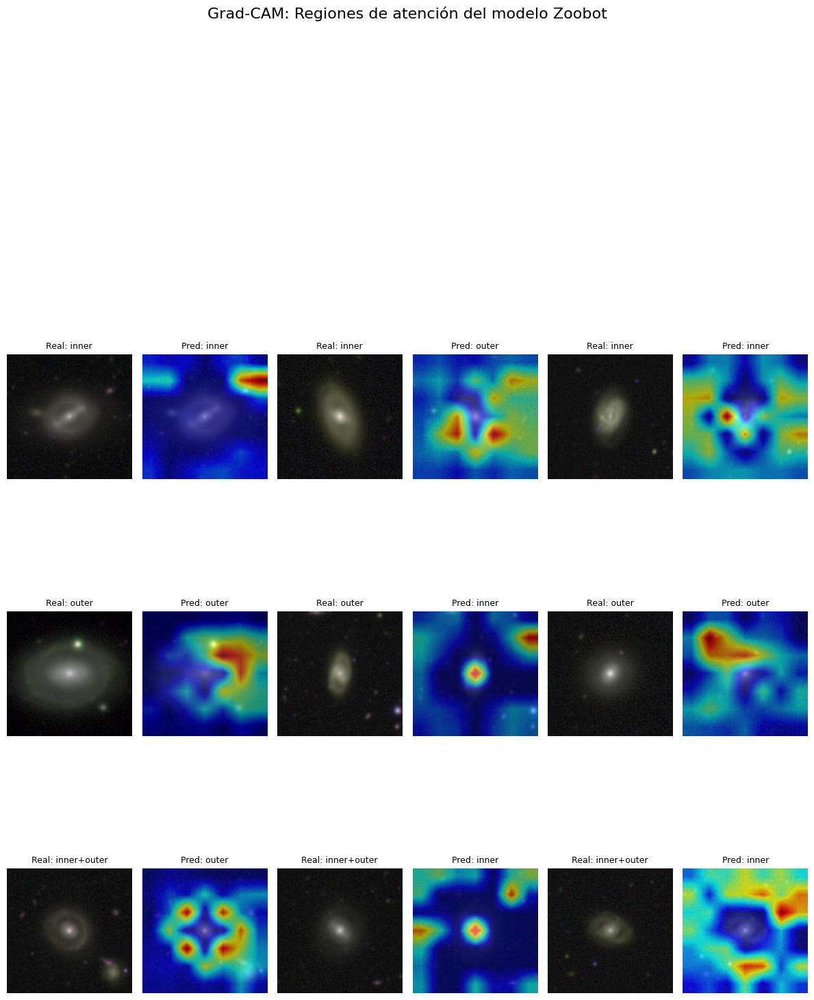

In [26]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget


def get_gradcam_target_layer(model):
    """Obtiene la última capa convolucional del encoder para GradCAM."""
    target_layer = None
    for module in model.encoder.modules():
        if isinstance(module, nn.Conv2d):
            target_layer = module
    return target_layer


def visualize_gradcam(model, val_dataset, ring_types, n_samples=4):
    """Visualiza mapas GradCAM para muestras de cada clase."""
    model.eval()
    model.to(model.device)

    target_layer = get_gradcam_target_layer(model)
    if target_layer is None:
        print("No se encontró capa convolucional para GradCAM")
        return

    cam = GradCAM(model=model, target_layers=[target_layer])

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    fig, axs = plt.subplots(
        len(ring_types),
        n_samples * 2,
        figsize=(4 * n_samples, 4 * len(ring_types)),
        squeeze=False
    )

    for i, cls in enumerate(ring_types):
        indices = [
            idx for idx, (_, lbl, _) in enumerate(val_dataset.samples)
            if val_dataset.idx_to_class[lbl] == cls
        ]

        if not indices:
            for j in range(n_samples * 2):
                axs[i, j].axis("off")
            continue

        chosen = np.random.choice(indices, min(n_samples, len(indices)), replace=False)

        for j in range(n_samples):
            col_orig = j * 2
            col_cam = j * 2 + 1
            ax_orig = axs[i, col_orig]
            ax_cam = axs[i, col_cam]

            if j >= len(chosen):
                ax_orig.axis("off")
                ax_cam.axis("off")
                continue

            idx = chosen[j]
            image, label = val_dataset[idx]
            img_tensor = image.unsqueeze(0).to(model.device)

            with torch.no_grad():
                outputs = model(img_tensor)
                pred_cls_idx = torch.argmax(outputs, 1).item()
                pred_cls = ring_types[pred_cls_idx]

            targets = [ClassifierOutputTarget(pred_cls_idx)]
            grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0]

            img_np = image.cpu().numpy().transpose(1, 2, 0)
            img_np = std * img_np + mean
            img_np = np.clip(img_np, 0, 1).astype(np.float32)

            ax_orig.imshow(img_np)
            ax_orig.set_title(f"Real: {cls}", fontsize=9)
            ax_orig.axis("off")

            cam_image = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)
            ax_cam.imshow(cam_image)
            ax_cam.set_title(f"Pred: {pred_cls}", fontsize=9)
            ax_cam.axis("off")

    try:
        cam.__del__()
    except Exception:
        pass

    plt.suptitle("Grad-CAM: Regiones de atención del modelo Zoobot", fontsize=16)
    plt.tight_layout()
    plt.show()


visualize_gradcam(model, val_dataset, RING_TYPE, n_samples=3)

---
# Parte 11: Análisis morfológico

## 11.1 Fundamento teórico

La medición morfológica de galaxias con anillos requiere identificar y cuantificar tres
estructuras clave: **anillos** (inner/outer), **barra galáctica** y **disco**.

**Pipeline morfológico v2:**
1. Carga y preparación de imagen
2. Segmentación multi-umbral con enmascaramiento de estrellas
3. Perfil radial robusto (mediana + Savitzky-Golay)
4. Detección de picos adaptativos con validación azimutal
5. Ajuste de elipses a isófotas
6. Detección de barra por perfil de elipticidad
7. Visualización y mediciones


## 11.2 Funciones de segmentación y medición


In [27]:
# ============================================================
# 1) Carga y preparación de imagen
# ============================================================
def prepare_galaxy_image(fits_path):
    """Carga un FITS local, aplica la transformación y prepara imagen RGB + gris."""
    fits_path = Path(fits_path)

    with fits.open(fits_path) as hdul:
        data = hdul[0].data

        # Asume orden tipo Gabriel: [G, R, I]
        g_band = data[0]
        r_band = data[1]
        i_band = data[2]

        img = Transformations.apply_transform(r_band, g_band, i_band, TRANSFORM)

        if img is None:
            raise ValueError(f"No se pudo transformar FITS: {fits_path}")

    img = np.asarray(img)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype(np.float64) / 255.0
    return img, gray


# ============================================================
# 2) Segmentación de galaxia (multi-umbral)
# ============================================================
def segment_galaxy_improved(gray, sigma=2.0):
    """Segmentación mejorada con multi-umbral (bajo para halo, Otsu para núcleo)."""
    smoothed = gaussian(gray, sigma=sigma)
    bg_estimate = np.percentile(smoothed[smoothed > 0], 30)
    low_mask = smoothed > bg_estimate

    try:
        thresh_otsu_val = threshold_otsu(smoothed[smoothed > 0])
    except ValueError:
        thresh_otsu_val = smoothed.mean()

    high_mask = smoothed > thresh_otsu_val

    mask = binary_closing(low_mask, disk(3))
    mask = binary_opening(mask, disk(2))

    labeled_img = label(mask)
    if labeled_img.max() > 0:
        regions = regionprops(labeled_img)
        largest = max(regions, key=lambda r: r.area)
        mask = labeled_img == largest.label

    return mask, smoothed, high_mask


# ============================================================
# 3) Centro de la galaxia
# ============================================================
def find_galaxy_center(mask, gray=None):
    """Centro: pico de brillo o centroide de máscara."""
    if gray is not None:
        masked_gray = gray * mask
        smoothed = gaussian(masked_gray, sigma=3)
        cy, cx = np.unravel_index(smoothed.argmax(), smoothed.shape)
        return int(cy), int(cx)

    props = regionprops(label(mask.astype(int)))
    if props:
        cy, cx = props[0].centroid
        return int(cy), int(cx)

    h, w = mask.shape
    return h // 2, w // 2


# ============================================================
# 4) Enmascarar fuentes puntuales (estrellas)
# ============================================================
def mask_point_sources(gray, mask, center, sigma_detect=3.0, min_size=3, max_size=80):
    """Enmascara estrellas de campo que contaminan el análisis."""
    cy, cx = center
    smoothed = gaussian(gray, sigma=1.0)
    background = gaussian(gray, sigma=10.0)
    residual = smoothed - background
    threshold = residual.mean() + sigma_detect * residual.std()
    sources = residual > threshold
    labeled_src = label(sources.astype(int))
    clean_mask = mask.copy()

    for region in regionprops(labeled_src):
        ry, rx = region.centroid
        dist = np.sqrt((rx - cx) ** 2 + (ry - cy) ** 2)
        if (region.area < max_size and region.area >= min_size
                and dist > 15 and region.eccentricity < 0.8):
            clean_mask[labeled_src == region.label] = False

    return clean_mask


# ============================================================
# 5) Perfil radial robusto (mediana)
# ============================================================
def radial_profile_robust(image, center, mask=None, use_median=True):
    """Perfil radial usando mediana (robusto a contaminantes)."""
    cy, cx = center
    h, w = image.shape
    y, x = np.ogrid[:h, :w]
    r = np.sqrt((x - cx) ** 2 + (y - cy) ** 2).astype(int)
    max_r = min(cy, cx, h - cy, w - cx)
    radii = np.arange(0, max_r)
    profile = np.zeros(len(radii), dtype=float)

    for i, radius in enumerate(radii):
        ring_pixels = image[r == radius]
        if mask is not None:
            ring_mask = mask[r == radius]
            ring_pixels = ring_pixels[ring_mask]
        if ring_pixels.size > 0:
            profile[i] = np.median(ring_pixels) if use_median else ring_pixels.mean()

    return radii, profile


# ============================================================
# 6) Detección de picos (anillos) con filtros adaptativos
# ============================================================
def find_ring_radii_improved(radii, profile, min_radius_frac=0.1):
    """Detección de anillos con prominencia adaptativa y Savitzky-Golay."""
    if len(profile) < 20:
        return [], profile

    window = min(21, len(profile) // 5)
    if window % 2 == 0:
        window += 1
    window = max(5, window)
    profile_smooth = savgol_filter(profile, window_length=window, polyorder=3)

    dynamic_range = profile_smooth.max() - profile_smooth.min()
    min_prominence = dynamic_range * 0.03
    skip_center = max(8, int(len(profile) * min_radius_frac))
    min_distance = max(5, len(profile) // 12)

    search_region = profile_smooth[skip_center:]
    peaks, _ = find_peaks(
        search_region,
        distance=min_distance,
        prominence=min_prominence,
        width=2
    )
    peaks = peaks + skip_center

    ring_peaks = []
    for peak in peaks:
        if peak >= len(radii):
            continue

        intensity = profile_smooth[peak]
        local_range = slice(max(0, peak - 25), min(len(profile_smooth), peak + 25))
        local_bg = np.percentile(profile_smooth[local_range], 25)

        if intensity > local_bg * 1.05:
            rpx = int(radii[peak])
            ring_peaks.append({
                "radius_px": rpx,
                "radius_arcsec": rpx * PLATE_SCALE,
                "intensity": float(intensity),
                "contrast": float((intensity - local_bg) / max(local_bg, 1e-6)),
                "circumference_px": float(2 * np.pi * rpx),
                "circumference_arcsec": float(2 * np.pi * rpx * PLATE_SCALE),
            })

    return ring_peaks, profile_smooth


# ============================================================
# 7) Validación azimutal
# ============================================================
def azimuthal_profile(image, center, radius, width=5, n_sectors=36):
    """Perfil azimutal para validar que un pico radial es un anillo real."""
    cy, cx = center
    h, w = image.shape
    y, x = np.mgrid[:h, :w]
    r = np.sqrt((x - cx) ** 2 + (y - cy) ** 2)
    theta = np.arctan2(y - cy, x - cx)
    ring_mask = (r >= radius - width) & (r <= radius + width)
    sector_angles = np.linspace(-np.pi, np.pi, n_sectors + 1)
    intensities = []

    for i in range(n_sectors):
        sector = ring_mask & (theta >= sector_angles[i]) & (theta < sector_angles[i + 1])
        pixels = image[sector]
        intensities.append(np.median(pixels) if pixels.size > 0 else 0)

    intensities = np.array(intensities, dtype=float)
    cv = intensities.std() / max(intensities.mean(), 1e-6)
    coverage = np.sum(intensities > np.percentile(intensities, 25)) / n_sectors

    return {
        "profile": intensities,
        "uniformity_cv": float(cv),
        "coverage": float(coverage),
        "is_ring_like": bool(cv < 0.8 and coverage > 0.5)
    }


# ============================================================
# 8) Ajuste de elipse a isófota
# ============================================================
def fit_ellipse_to_isophote(gray, center, radius, mask=None, tolerance=8):
    """Ajusta elipse a la isófota en el radio del anillo."""
    cy, cx = center
    h, w = gray.shape
    y, x = np.ogrid[:h, :w]
    r = np.sqrt((x - cx) ** 2 + (y - cy) ** 2)
    annulus = (r >= radius - tolerance) & (r <= radius + tolerance)

    if mask is not None:
        annulus &= mask

    ring_region = gray * annulus
    if ring_region.max() == 0:
        return None

    if np.any(ring_region > 0):
        thresh = np.percentile(ring_region[ring_region > 0], 40)
    else:
        thresh = 0

    iso_mask = (ring_region > thresh) & annulus
    iso_mask = binary_closing(iso_mask, disk(2))
    labeled_iso = label(iso_mask.astype(int))
    regions = regionprops(labeled_iso)

    if not regions:
        return None

    largest = max(regions, key=lambda r: r.area)
    if largest.area < 20:
        return None

    a = largest.major_axis_length / 2
    b = largest.minor_axis_length / 2
    circ_ramanujan = np.pi * (3 * (a + b) - np.sqrt((3 * a + b) * (a + 3 * b)))

    return {
        "semi_a": float(a),
        "semi_b": float(b),
        "semi_a_arcsec": float(a * PLATE_SCALE),
        "semi_b_arcsec": float(b * PLATE_SCALE),
        "angle": float(np.degrees(largest.orientation)),
        "eccentricity": float(largest.eccentricity),
        "area_px": int(largest.area),
        "area_arcsec2": float(largest.area * PLATE_SCALE**2),
        "centroid": tuple(largest.centroid),
        "circumference_px": float(circ_ramanujan),
        "circumference_arcsec": float(circ_ramanujan * PLATE_SCALE),
    }

print("Funciones de segmentación y medición cargadas")

Funciones de segmentación y medición cargadas


## 11.3 Detección y medición de barras galácticas


In [28]:
# ============================================================
# Perfil de elipticidad vs radio
# ============================================================
def ellipticity_profile(gray, center, mask, max_radius=None, n_radii=30):
    """Calcula perfil de elipticidad y ángulo vs radio mediante isófotas aproximadas."""
    cy, cx = center
    h, w = gray.shape
    if max_radius is None:
        max_radius = int(min(cy, cx, h - cy, w - cx) * 0.5)

    radii_test = np.linspace(5, max_radius, n_radii).astype(int)
    y, x = np.ogrid[:h, :w]
    r_map = np.sqrt((x - cx) ** 2 + (y - cy) ** 2)
    ellipticities, angles_deg = [], []

    for r_test in radii_test:
        annulus = (r_map >= r_test - 4) & (r_map <= r_test + 4) & mask
        masked_region = gray * annulus

        if masked_region.sum() == 0:
            ellipticities.append(0.0)
            angles_deg.append(0.0)
            continue

        valid = masked_region[masked_region > 0]
        if valid.size < 10:
            ellipticities.append(0.0)
            angles_deg.append(0.0)
            continue

        thresh = np.percentile(valid, 40)
        iso = (masked_region > thresh) & annulus
        iso = binary_closing(iso, disk(1))
        labeled_iso = label(iso.astype(int))
        regions = regionprops(labeled_iso)

        if not regions:
            ellipticities.append(0.0)
            angles_deg.append(0.0)
            continue

        largest = max(regions, key=lambda r: r.area)
        ellipticities.append(float(largest.eccentricity))
        angles_deg.append(float(np.degrees(largest.orientation)))

    return radii_test, np.array(ellipticities), np.array(angles_deg)


# ============================================================
# Detección de barra usando perfil de elipticidad
# ============================================================
def detect_bar_improved(gray, mask, center, max_bar_radius_fraction=0.5):
    """Detección de barra usando pico de elipticidad y validación de ángulo."""
    cy, cx = center
    h, w = gray.shape
    max_r = int(min(cy, cx, h - cy, w - cx) * max_bar_radius_fraction)
    radii_test, ellipticities, angles = ellipticity_profile(gray, center, mask, max_r, 30)

    if ellipticities.size == 0 or ellipticities.max() < 0.4:
        return None

    if len(ellipticities) >= 5:
        win = min(7, len(ellipticities))
        if win % 2 == 0:
            win -= 1
        e_smooth = savgol_filter(ellipticities, win, 2)
    else:
        e_smooth = ellipticities

    peak_idx = int(np.argmax(e_smooth))
    peak_e = float(e_smooth[peak_idx])
    if peak_e < 0.5:
        return None

    bar_end_idx = peak_idx
    for i in range(peak_idx + 1, len(e_smooth)):
        if e_smooth[i] < peak_e - 0.15:
            bar_end_idx = i
            break
    else:
        bar_end_idx = min(peak_idx + 3, len(radii_test) - 1)

    bar_radius = int(radii_test[bar_end_idx])
    ang_start = max(0, peak_idx - 2)
    bar_angle = float(np.median(angles[ang_start:bar_end_idx + 1]))

    outer_start = min(bar_end_idx + 3, len(angles) - 1)
    disk_angle = None
    angle_diff = 45.0

    if outer_start < len(angles):
        disk_angle = float(np.median(angles[outer_start:]))
        angle_diff = abs(bar_angle - disk_angle) % 180
        angle_diff = min(angle_diff, 180 - angle_diff)

    is_likely_bar = (angle_diff > 10) or (peak_e > 0.7)
    if not is_likely_bar:
        return None

    smoothed = gaussian(gray, sigma=1.5)
    y, x = np.ogrid[:h, :w]
    r_map = np.sqrt((x - cx) ** 2 + (y - cy) ** 2)
    bar_region = (r_map <= bar_radius) & mask
    bar_img = smoothed * bar_region
    thresh = np.percentile(bar_img[bar_img > 0], 50) if np.any(bar_img > 0) else 0
    bar_mask = (bar_img > thresh) & bar_region
    bar_mask = binary_closing(bar_mask, disk(2))
    labeled_bar = label(bar_mask.astype(int))
    regions = regionprops(labeled_bar)

    if not regions:
        return None

    largest = max(regions, key=lambda r: r.area)

    return {
        "is_bar": True,
        "length_px": float(largest.major_axis_length),
        "width_px": float(largest.minor_axis_length),
        "length_arcsec": float(largest.major_axis_length * PLATE_SCALE),
        "width_arcsec": float(largest.minor_axis_length * PLATE_SCALE),
        "aspect_ratio": float(largest.major_axis_length / max(largest.minor_axis_length, 1.0)),
        "angle": float(np.degrees(largest.orientation)),
        "bar_angle_median": bar_angle,
        "disk_angle": disk_angle,
        "angle_diff_bar_disk": float(angle_diff),
        "eccentricity": float(largest.eccentricity),
        "peak_ellipticity": peak_e,
        "bar_radius_px": int(bar_radius),
        "bar_radius_arcsec": float(bar_radius * PLATE_SCALE),
        "centroid": tuple(largest.centroid),
        "area_px": int(largest.area),
        "ellipticity_profile": (radii_test, e_smooth, angles),
    }


def measure_bar_endpoints(gray, center, bar_info):
    """Calcula los extremos de la barra para visualización."""
    cy, cx = center
    angle_rad = np.radians(bar_info["angle"])
    half_length = bar_info["length_px"] / 2.0
    dx = half_length * np.cos(angle_rad)
    dy = half_length * np.sin(angle_rad)
    return (cx - dx, cy - dy), (cx + dx, cy + dy)


print("Detección de barra cargada")

Detección de barra cargada


## 11.4 Pipeline completo de análisis morfológico


In [29]:
# ============================================================
# Helpers del pipeline
# ============================================================
def _classify_rings(ellipses):
    if not ellipses:
        return ellipses
    if len(ellipses) >= 2:
        ellipses.sort(key=lambda e: e["semi_a"])
        ellipses[0]["type"] = "Inner"
        ellipses[-1]["type"] = "Outer"
        for e in ellipses[1:-1]:
            e["type"] = "Middle"
    else:
        ellipses[0]["type"] = "Inner"
    return ellipses


def _validate_ring_peaks(smoothed, center, ring_peaks, width=6):
    validated = []
    for peak in ring_peaks:
        az = azimuthal_profile(smoothed, center, peak["radius_px"], width=width)
        peak["azimuthal"] = az
        if az.get("is_ring_like", False):
            validated.append(peak)
        else:
            peak["rejected"] = "low_azimuthal_uniformity"
    return validated


def _fit_ring_ellipses(smoothed, center, clean_mask, validated_peaks, tolerance=10):
    ellipses = []
    for peak in validated_peaks:
        ell = fit_ellipse_to_isophote(
            smoothed,
            center,
            peak["radius_px"],
            mask=clean_mask,
            tolerance=tolerance
        )
        if ell is None:
            continue
        ell["ring_radius_px"] = peak["radius_px"]
        ell["ring_radius_arcsec"] = peak["radius_arcsec"]
        ell["contrast"] = peak.get("contrast", 0.0)
        ellipses.append(ell)
    return ellipses


# ============================================================
# Visualización de resultados morfológicos (4 paneles)
# ============================================================
def _plot_results(img_rgb, gray, mask, center, ellipses, ring_peaks,
                  validated_peaks, radii, profile, profile_smooth,
                  bar_info, fits_path, ring_type_label=None):
    cy, cx = center
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    title_prefix = f"{ring_type_label} - " if ring_type_label else ""
    fname = Path(fits_path).stem[:50]

    # Panel 1: Imagen original
    axes[0].imshow(img_rgb)
    axes[0].plot(cx, cy, "r+", markersize=15, markeredgewidth=2)
    axes[0].set_title(f"{title_prefix}Stack GRI\n{fname}", fontsize=8)
    axes[0].axis("off")

    # Panel 2: Máscara + elipses + barra
    overlay = img_rgb.copy().astype(np.float64) / 255.0
    axes[1].imshow(overlay)
    mask_rgba = np.zeros((*mask.shape, 4), dtype=float)
    mask_rgba[mask, :3] = [0.5, 0.2, 0.2]
    mask_rgba[mask, 3] = 0.35
    axes[1].imshow(mask_rgba)

    colors_ring = {
        "Inner": (0.2, 0.6, 1.0),
        "Outer": (1.0, 0.5, 0.0),
        "Middle": (0.0, 1.0, 0.5)
    }

    for ell in ellipses:
        color = colors_ring.get(ell["type"], (1, 1, 0))
        e_patch = Ellipse(
            xy=(cx, cy),
            width=ell["semi_a"] * 2,
            height=ell["semi_b"] * 2,
            angle=-ell["angle"],
            fill=False,
            edgecolor=color,
            linewidth=2.5
        )
        axes[1].add_patch(e_patch)
        axes[1].annotate(
            f"{ell['type']}  C={ell.get('circumference_px', 0):.1f}px",
            xy=(cx + ell["semi_a"] * 0.3, cy - ell["semi_b"] * 0.3),
            fontsize=7,
            color=color,
            bbox=dict(boxstyle="round,pad=0.2", facecolor="black", alpha=0.6)
        )

    if bar_info is not None:
        (x1, y1), (x2, y2) = measure_bar_endpoints(gray, center, bar_info)
        axes[1].plot([x1, x2], [y1, y2], "lime", linewidth=3)
        axes[1].annotate(
            f"Barra: {bar_info['length_arcsec']:.1f}\"\nL/W={bar_info['aspect_ratio']:.1f}",
            xy=(cx, cy + 20),
            fontsize=7,
            color="lime",
            bbox=dict(boxstyle="round,pad=0.2", facecolor="black", alpha=0.6),
            ha="center"
        )

    axes[1].set_title("Máscara + elipses + barra", fontsize=10)
    axes[1].axis("off")

    # Panel 3: Perfil radial
    axes[2].plot(radii, profile_smooth, "b-", linewidth=1.5, label="Perfil (mediana+Savgol)")
    axes[2].plot(radii[:len(profile)], profile[:len(radii)], "gray", alpha=0.3, linewidth=0.8)
    for peak in validated_peaks:
        axes[2].axvline(peak["radius_px"], color="red", linestyle="--", alpha=0.7)
    if bar_info:
        axes[2].axvspan(
            0,
            bar_info["bar_radius_px"],
            alpha=0.12,
            color="green",
            label=f"Barra (r={bar_info['bar_radius_px']}px)"
        )
    axes[2].set_xlabel("Radio (px)")
    axes[2].set_ylabel("Intensidad mediana")
    axes[2].set_title("Perfil radial")
    axes[2].legend(fontsize=7)
    axes[2].grid(True, alpha=0.3)

    # Panel 4: Perfil elipticidad
    if bar_info and "ellipticity_profile" in bar_info:
        r_e, e_prof, a_prof = bar_info["ellipticity_profile"]
        axes[3].plot(r_e, e_prof, "o-", markersize=3, linewidth=1.5, label="Elipticidad")
        axes[3].axvline(bar_info["bar_radius_px"], color="green", linestyle="--", alpha=0.7)
        ax_a = axes[3].twinx()
        ax_a.plot(r_e, a_prof, "s-", markersize=2, linewidth=1, alpha=0.7, color="orange", label="PA")
        ax_a.set_ylabel("PA (°)")
        ax_a.legend(fontsize=7, loc="upper right")
        axes[3].set_title("Elipticidad + PA")
        axes[3].legend(fontsize=7)
        axes[3].grid(True, alpha=0.3)
    else:
        axes[3].text(
            0.5,
            0.5,
            "Sin barra\ndetectada",
            ha="center",
            va="center",
            fontsize=14,
            color="gray",
            transform=axes[3].transAxes
        )
        axes[3].set_title("Perfil elipticidad")

    plt.suptitle(f"Análisis morfológico v2: {title_prefix.rstrip(' - ')}", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()


# ============================================================
# Pipeline principal
# ============================================================
def morphological_analysis(fits_path, ring_type_label=None, show_plot=True):
    """Pipeline completo de análisis morfológico v2 sobre FITS local."""
    img_rgb, gray = prepare_galaxy_image(fits_path)
    mask, smoothed, high_mask = segment_galaxy_improved(gray, sigma=2.0)
    center = find_galaxy_center(mask, gray)
    clean_mask = mask_point_sources(gray, mask, center)
    radii, profile = radial_profile_robust(smoothed, center, mask=clean_mask, use_median=True)
    ring_peaks, profile_smooth = find_ring_radii_improved(radii, profile)
    validated_peaks = _validate_ring_peaks(smoothed, center, ring_peaks, width=6)
    ellipses = _fit_ring_ellipses(smoothed, center, clean_mask, validated_peaks, tolerance=10)
    bar_info = detect_bar_improved(gray, mask, center)
    ellipses = _classify_rings(ellipses)

    results = {
        "fits_path": str(fits_path),
        "center": center,
        "rings": ellipses,
        "ring_peaks_all": ring_peaks,
        "ring_peaks_validated": validated_peaks,
        "profile": (radii, profile_smooth),
        "bar": bar_info,
    }

    if show_plot:
        _plot_results(
            img_rgb,
            gray,
            mask,
            center,
            ellipses,
            ring_peaks,
            validated_peaks,
            radii,
            profile,
            profile_smooth,
            bar_info,
            fits_path,
            ring_type_label
        )

    # Resumen en consola
    cy, cx = center
    print(f"\n{'='*60}")
    print(f" Centro: ({cx}, {cy})px | Anillos: {len(ellipses)} | Barra: {'Sí' if bar_info else 'No'}")
    for ell in ellipses:
        print(
            f"  {ell['type']} Ring — radio={ell['ring_radius_px']}px "
            f"({ell['ring_radius_arcsec']:.2f}\"), e={ell['eccentricity']:.3f}"
        )
    if bar_info:
        print(
            f"  Barra — L={bar_info['length_arcsec']:.1f}\", "
            f"L/W={bar_info['aspect_ratio']:.1f}, PA={bar_info['angle']:.1f}°"
        )
    print(f"{'='*60}")

    return results


print("Pipeline morfológico v2 completo")

Pipeline morfológico v2 completo


## 11.5 Ejecutar análisis morfológico por clase


Sin FITS válidos para none

######################################################################
# Clase: INNER
######################################################################


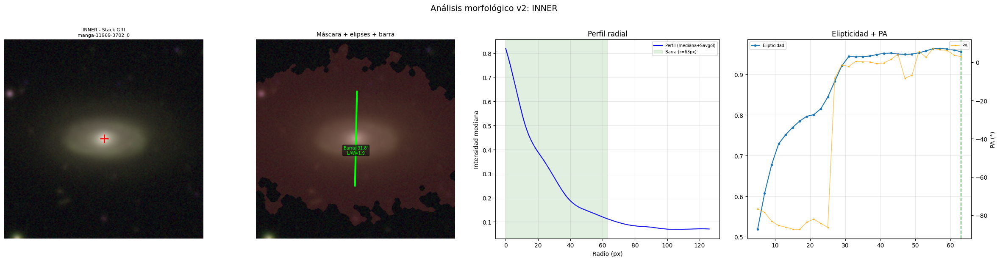


 Centro: (128, 127)px | Anillos: 0 | Barra: Sí
  Barra — L=31.8", L/W=1.9, PA=-88.8°


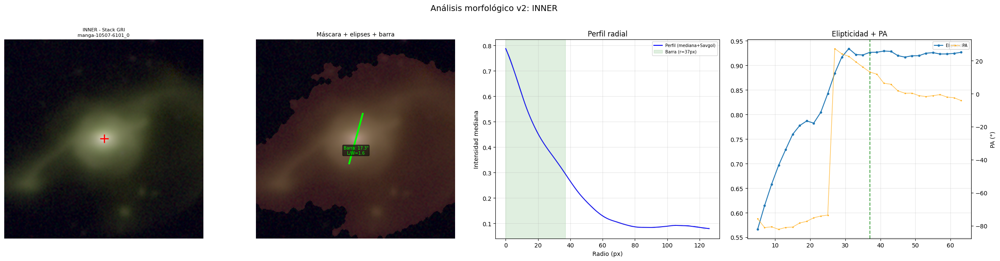


 Centro: (128, 127)px | Anillos: 0 | Barra: Sí
  Barra — L=17.3", L/W=1.6, PA=-74.8°


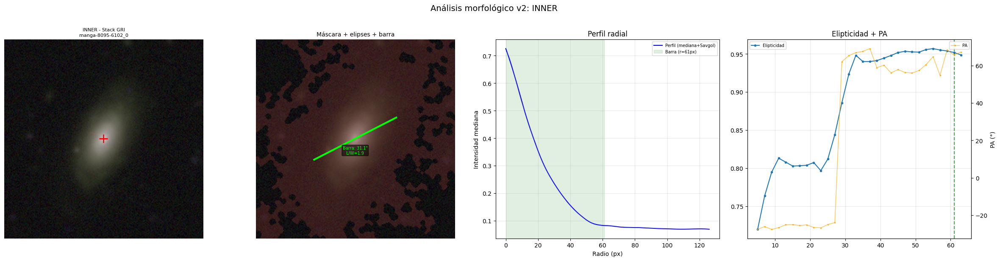


 Centro: (127, 127)px | Anillos: 0 | Barra: Sí
  Barra — L=31.1", L/W=1.9, PA=-27.1°

######################################################################
# Clase: OUTER
######################################################################


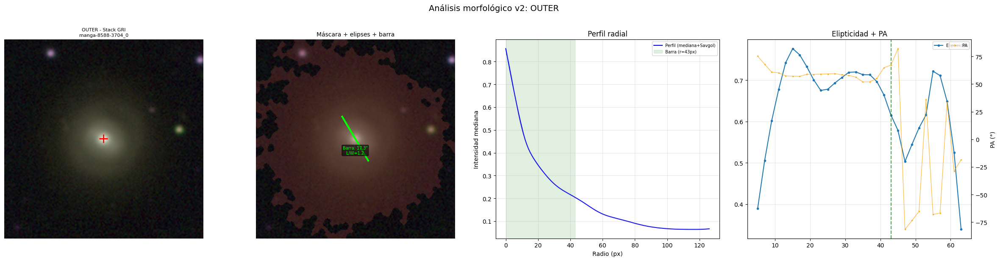


 Centro: (127, 127)px | Anillos: 0 | Barra: Sí
  Barra — L=17.3", L/W=1.2, PA=59.4°


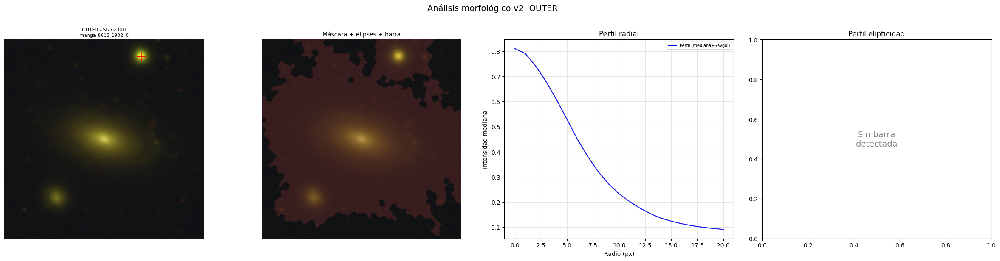


 Centro: (175, 21)px | Anillos: 0 | Barra: No


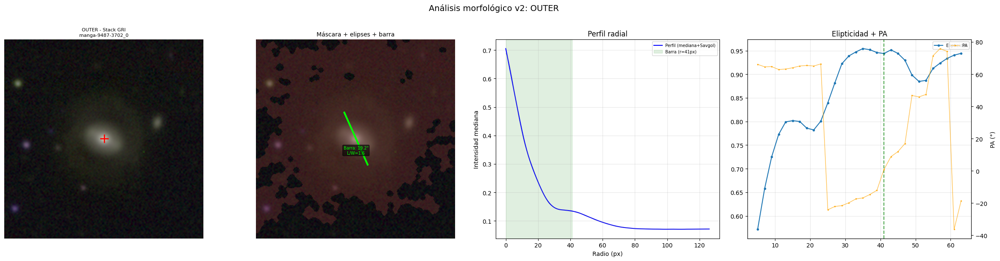


 Centro: (128, 127)px | Anillos: 0 | Barra: Sí
  Barra — L=19.2", L/W=1.6, PA=65.9°

######################################################################
# Clase: INNER+OUTER
######################################################################


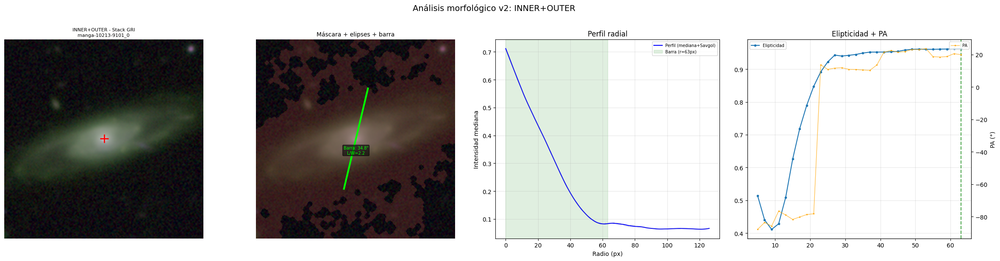


 Centro: (128, 127)px | Anillos: 0 | Barra: Sí
  Barra — L=34.8", L/W=2.2, PA=-76.5°


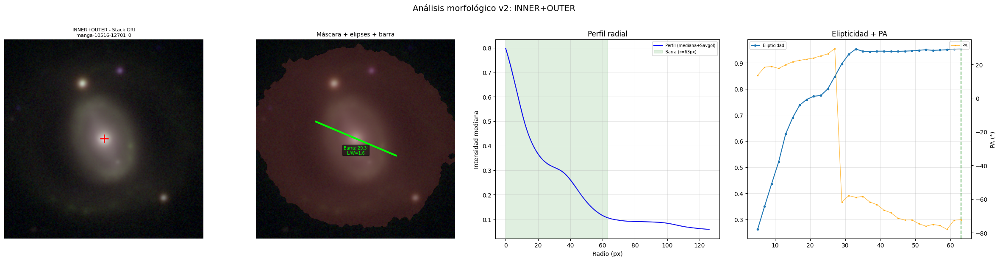


 Centro: (128, 127)px | Anillos: 0 | Barra: Sí
  Barra — L=29.3", L/W=1.6, PA=22.9°


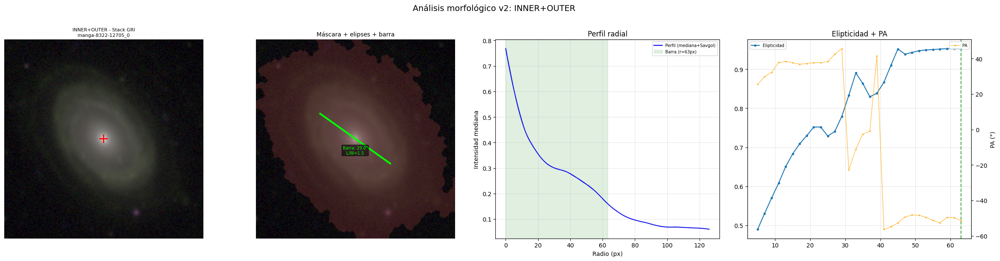


 Centro: (127, 127)px | Anillos: 0 | Barra: Sí
  Barra — L=29.0", L/W=1.5, PA=35.4°


In [30]:
# ============================================================
# Ejecutar análisis sobre muestras de cada clase
# ============================================================
np.random.seed(SEED)
all_morph_results = {}

for cls in RING_TYPE:
    cls_df = df_all[df_all["ring_type"] == cls].copy()
    cls_df = cls_df[cls_df["fits_path"].notna()].copy()
    cls_df = cls_df[cls_df["fits_path"].apply(lambda p: Path(p).exists())].copy()

    if cls_df.empty:
        print(f"Sin FITS válidos para {cls}")
        continue

    print(f"\n{'#'*70}")
    print(f"# Clase: {cls.upper()}")
    print(f"{'#'*70}")

    n_samples = min(3, len(cls_df))
    sampled_rows = cls_df.sample(n=n_samples, random_state=SEED)

    class_results = []
    for _, row in sampled_rows.iterrows():
        fits_path = Path(row["fits_path"])
        try:
            res = morphological_analysis(fits_path, ring_type_label=cls.upper())
            class_results.append(res)
        except Exception as e:
            print(f"  Error procesando {fits_path.name}: {e}")

    all_morph_results[cls] = class_results

## 11.6 Visualización morfológica guiada por la predicción (adaptado de Stage 2)

La sección anterior conserva el pipeline morfológico completo del backbone.
Aquí se añade la visualización más directa de **Stage 2**: predicción del modelo,
probabilidades por clase y elipses de anillos dibujadas sobre la galaxia transformada.


In [ ]:
def detect_rings_guided_v2(img_rgb, predicted_class):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY).astype(np.float64) / 255.0
    h, w = gray.shape
    cy, cx = find_galaxy_center(gray)

    smoothed = gaussian(gray, sigma=2.0)
    smooth_model = gaussian(gray, sigma=12)
    residual = gray - smooth_model

    rmin, rmax = residual.min(), residual.max()
    if rmax > rmin:
        residual = (residual - rmin) / (rmax - rmin)
    residual = gaussian(residual, sigma=1.5)

    y, x = np.ogrid[:h, :w]
    r_map = np.sqrt((x - cx)**2 + (y - cy)**2).astype(int)
    max_r = max(min(cy, cx, h - cy, w - cx), 20)
    radii = np.arange(0, max_r)

    res_profile = np.array([
        np.median(residual[r_map == r]) if np.any(r_map == r) else 0
        for r in radii
    ])

    if len(res_profile) >= 7:
        win = min(15, len(res_profile) // 5)
        if win % 2 == 0:
            win += 1
        win = max(5, win)
        res_smooth = savgol_filter(res_profile, win, 3)
    else:
        res_smooth = res_profile

    skip = max(5, int(len(res_smooth) * 0.08))
    search = res_smooth[skip:]
    peak_radii = []

    if len(search) > 5:
        dyn_range = search.max() - search.min()
        peaks, _ = find_peaks(
            search,
            distance=max(5, len(search)//8),
            prominence=max(dyn_range * 0.025, 0.001),
            width=2
        )
        peak_radii = [int(radii[p + skip]) for p in peaks if (p + skip) < len(radii)]

    ellipses = []
    for rpx in peak_radii:
        if rpx < 5 or rpx > max_r * 0.95:
            continue
        ellipses.append({
            "semi_a": rpx,
            "semi_b": max(4, rpx * 0.8),
            "angle": 0.0,
            "radius_px": rpx,
            "detected": True
        })

    ellipses.sort(key=lambda e: e["radius_px"])
    result = []

    if predicted_class == "inner":
        if ellipses:
            e = ellipses[0]
            e["type"] = "Inner"
            result = [e]
    elif predicted_class == "outer":
        if ellipses:
            e = ellipses[-1]
            e["type"] = "Outer"
            result = [e]
    elif predicted_class == "inner+outer":
        if len(ellipses) >= 2:
            inner_e = ellipses[0]
            outer_e = ellipses[-1]
            inner_e["type"] = "Inner"
            outer_e["type"] = "Outer"
            result = [inner_e, outer_e]
        elif len(ellipses) == 1:
            e = ellipses[0]
            e["type"] = "Inner"
            result = [e]

    return result, (cy, cx)


def visualize_galaxy_rings_from_fits(model, fits_path, show_probs=True):
    model.eval()
    img_rgb = load_rgb_from_fits(fits_path)
    img_pil = Image.fromarray(img_rgb).convert("RGB")
    tensor = val_transform(img_pil).unsqueeze(0).to(model.device)

    with torch.no_grad():
        output = model(tensor)
        probs = F.softmax(output, dim=1).cpu().numpy()[0]
        pred_idx = int(np.argmax(probs))
        pred_class = RING_TYPE[pred_idx]
        confidence = probs[pred_idx]

    rings, (cy, cx) = detect_rings_guided_v2(img_rgb, pred_class)
    ring_colors = {"Inner": "#00BFFF", "Outer": "#FF8C00"}

    ncols = 3 if show_probs else 2
    fig, axes = plt.subplots(1, ncols, figsize=(6*ncols, 5))

    axes[0].imshow(img_rgb)
    axes[0].set_title("RGB transformada")
    axes[0].axis("off")

    axes[1].imshow(img_rgb)
    axes[1].plot(cx, cy, "r+", markersize=12, markeredgewidth=2)

    for ring in rings:
        rtype = ring["type"]
        color = ring_colors.get(rtype, "#FFFF00")
        e_patch = Ellipse(
            xy=(cx, cy),
            width=ring["semi_a"] * 2,
            height=ring["semi_b"] * 2,
            angle=-ring["angle"],
            fill=False,
            edgecolor=color,
            linewidth=2.5,
            linestyle="-"
        )
        axes[1].add_patch(e_patch)
        axes[1].annotate(
            f"{rtype} (r={ring['radius_px']}px)",
            xy=(cx, max(5, cy - ring["semi_b"] - 10)),
            fontsize=9,
            color="white",
            fontweight="bold",
            ha="center",
            va="bottom",
            bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.85)
        )

    axes[1].set_title(f"Pred: {pred_class} ({confidence:.0%})", fontsize=12, fontweight="bold")
    axes[1].axis("off")

    if show_probs:
        bars = axes[2].barh(RING_TYPE, probs)
        axes[2].set_xlim(0, 1)
        axes[2].set_title("Probabilidades")
        for bar, p in zip(bars, probs):
            axes[2].text(bar.get_width() + 0.02, bar.get_y() + bar.get_height()/2, f"{p:.1%}", va="center")

    plt.tight_layout()
    plt.show()

    return {"class": pred_class, "confidence": float(confidence), "rings": rings}


print("Visualización morfológica guiada lista")

for cls_name in RING_TYPE:
    cls_df = val_df[val_df["ring_type"] == cls_name].copy()
    cls_df = cls_df[cls_df["fits_path"].notna()].copy()
    cls_df = cls_df[cls_df["fits_path"].apply(lambda p: Path(p).exists())].copy()
    if cls_df.empty:
        continue

    print(f"\n{'='*60}")
    print(f"Clase: {cls_name.upper()}")
    print(f"{'='*60}")

    sample_row = cls_df.sample(n=1, random_state=SEED).iloc[0]
    result = visualize_galaxy_rings_from_fits(model, sample_row["fits_path"])
    print("Resultado:", result["class"], "| confianza:", f"{result['confidence']:.3f}")


---
# Parte 12: Integración — Predicción del modelo + Análisis morfológico

Combinamos la predicción del clasificador Zoobot con el análisis morfológico para
obtener una visión completa de cada galaxia.


In [31]:
def full_galaxy_analysis(model, img_path, val_transform, ring_types):
    """Pipeline completo: predicción Zoobot + análisis morfológico."""
    # ── 1) Predicción del modelo ──
    img_pil = Image.open(img_path).convert("RGB")
    img_tensor = val_transform(img_pil).unsqueeze(0).to(model.device)

    model.eval()
    with torch.no_grad():
        outputs = model(img_tensor)
        probs = F.softmax(outputs, dim=1).cpu().numpy()[0]
        pred_idx = np.argmax(probs)
        pred_cls = ring_types[pred_idx]
        confidence = probs[pred_idx]

    print(f"\n{'='*60}")
    print(f" ANÁLISIS COMPLETO: {Path(img_path).stem[:50]}")
    print(f"{'='*60}")
    print(f"  Predicción Zoobot: {pred_cls} (confianza: {confidence:.3f})")
    print(f"  Probabilidades: { {ring_types[i]: f'{p:.3f}' for i, p in enumerate(probs)} }")

    # ── 2) Análisis morfológico ──
    morph_results = morphological_analysis(img_path, ring_type_label=pred_cls.upper())

    # ── 3) Resumen combinado ──
    n_rings = len(morph_results["rings"])
    has_bar = morph_results["bar"] is not None

    print(f"\n  RESUMEN COMBINADO:")
    print(f"    Clase predicha:  {pred_cls}")
    print(f"    Anillos detectados morfológicamente: {n_rings}")
    print(f"    Barra detectada: {'Sí' if has_bar else 'No'}")

    # Consistencia entre predicción y morfología
    morph_label = "none"
    if n_rings == 1:
        ring_type = morph_results["rings"][0].get("type", "Inner")
        morph_label = "inner" if ring_type == "Inner" else "outer"
    elif n_rings >= 2:
        morph_label = "inner+outer"

    consistent = (pred_cls == morph_label)
    print(f"    Clasificación morfológica: {morph_label}")
    print(f"    Consistencia modelo-morfología: {'✓ Sí' if consistent else '✗ No'}")

    return {
        "prediction": pred_cls, "confidence": confidence,
        "probabilities": probs, "morphology": morph_results,
        "consistent": consistent,
    }


# ── Ejecutar sobre muestras ──
print("Análisis completo sobre muestras representativas:\n")
for cls in RING_TYPE:
    cls_dir = DATA_DIR / cls
    images = list(cls_dir.glob("*.png"))
    if images:
        sample = np.random.choice(images)
        try:
            full_galaxy_analysis(model, sample, val_transform, RING_TYPE)
        except Exception as e:
            print(f"Error en {cls}: {e}")


Análisis completo sobre muestras representativas:



---
# Parte 13: Exportar modelo y resultados


In [32]:
# ============================================================
# Guardar modelo final
# ============================================================
final_model_path = OUTPUT_DIR / "zoobot_ring_classifier_final.pt"
model.save_model(final_model_path)
print(f"Modelo final guardado en: {final_model_path}")

# ============================================================
# Guardar configuración del experimento
# ============================================================
config = {
    "model": "ZoobotRingClassifier (ConvNeXt Nano encoder via Zoobot v2)",
    "classes": RING_TYPE,
    "image_size": IMAGE_SIZE,
    "transform": TRANSFORM,
    "batch_size": BATCH_SIZE,
    "seed": SEED,
    "device": str(DEVICE),
    "dataset_csv": str(CSV_DATASET_FINAL),
    "outputs_dir": str(OUTPUT_DIR),
}

import json
config_path = OUTPUT_DIR / "experiment_config.json"
with open(config_path, "w") as f:
    json.dump(config, f, indent=2)

print(f"Configuración guardada en: {config_path}")

# ============================================================
# Función de inferencia para nuevas galaxias (desde FITS)
# ============================================================
def predict_galaxy(model, fits_path, transform, ring_types):
    """Clasifica una galaxia nueva a partir de un FITS local."""
    img_rgb, _ = prepare_galaxy_image(fits_path)
    img = Image.fromarray(np.asarray(img_rgb).astype(np.uint8)).convert("RGB")
    img_tensor = transform(img).unsqueeze(0).to(model.device)

    model.eval()
    with torch.no_grad():
        outputs = model(img_tensor)
        probs = F.softmax(outputs, dim=1).cpu().numpy()[0]
        pred_idx = np.argmax(probs)

    return ring_types[pred_idx], probs[pred_idx], dict(zip(ring_types, probs.tolist()))

# Ejemplo de uso:
# sample_fits = df_all["fits_path"].dropna().iloc[0]
# pred_class, confidence, all_probs = predict_galaxy(model, sample_fits, val_transform, RING_TYPE)
# print(f"Predicción: {pred_class} ({confidence:.3f})")

print("\nPipeline completo. Modelo listo para inferencia.")

Modelo guardado: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\zoobot_ring_classifier_final.pt
Modelo final guardado en: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\zoobot_ring_classifier_final.pt
Configuración guardada en: c:\Users\dark_\Downloads\Project_2 - Copy\outputs\experiment_config.json

Pipeline completo. Modelo listo para inferencia.
